In [1]:
import pandas as pd
import numpy as np
#data visualization packages
import matplotlib.pyplot as plt
#keras packages
import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Flatten
from keras.layers import Dense

#model evaluation packages
from sklearn.metrics import f1_score, roc_auc_score, log_loss
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import train_test_split


In [2]:
# Load the MNIST dataset

(x_train, y_train), (x_test, y_test) = keras.datasets.mnist.load_data()

In [3]:
x = np.concatenate((x_train, x_test))
y = np.concatenate((y_train, y_test))


In [4]:
x = x.astype('float32') / 255.

In [5]:
randlist=[1223, 91, 760, 1096, 670, 715, 373, 69, 538, 455]

In [6]:
train_array = [1]*10
test_array = [1]*10
X_train= [1]*10
X_test= [1]*10
y_train= [1]*10
y_test = [1]*10
for i in range(10):
    X_train[i], X_test[i], y_train[i], y_test[i] = train_test_split(x, y, test_size=0.33, random_state=randlist[i])

    

In [8]:
class_names = ['Zero', 'One', 'Two', 'Three', 'Four', 'Five', 'Six', 'Seven', 'Eight', 'Nine']


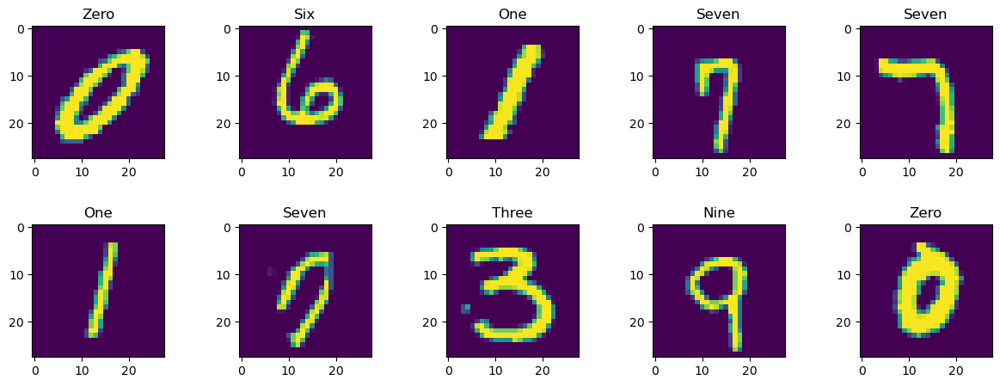

In [9]:
fig, axes = plt.subplots(nrows=2, ncols=5,figsize=(15,5))          
ax = axes.ravel()
for i in range(10):
    ax[i].imshow(X_train[2][i].reshape(28,28))
    ax[i].title.set_text(class_names[y_train[2][i]])              
plt.subplots_adjust(hspace=0.5)                                    
plt.show()

In [10]:
print(X_train[1].shape, y_train[1].shape, X_test[1].shape, y_test[1].shape)


(46900, 28, 28) (46900,) (23100, 28, 28) (23100,)


In [12]:
# Define the model architecture
model = np.ones((10,15)).astype('object')

for i in range(10):
#     for j in range(15):

        
        model[i][0] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][1] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][2] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][3] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][4] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(75, activation='sigmoid'),
            keras.layers.Dense(25, activation='sigmoid'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][5] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(75, activation='relu'),
            keras.layers.Dense(25, activation='relu'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][6] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][7] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][8] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][9] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(25, activation='tanh'),
            keras.layers.Dense(100, activation='tanh'),
            keras.layers.Dense(25, activation='tanh'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        
        model[i][10] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(25, activation='sigmoid'),
            keras.layers.Dense(100, activation='sigmoid'),
            keras.layers.Dense(25, activation='sigmoid'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][11] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(25, activation='relu'),
            keras.layers.Dense(100, activation='relu'),
            keras.layers.Dense(25, activation='relu'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][12] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(75, activation='tanh'),
            keras.layers.Dense(50, activation='tanh'),
            keras.layers.Dense(25, activation='tanh'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][13] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(75, activation='sigmoid'),
            keras.layers.Dense(50, activation='sigmoid'),
            keras.layers.Dense(25, activation='sigmoid'),
            keras.layers.Dense(10, activation='softmax')
        ])
        
        model[i][14] = keras.Sequential([
            keras.layers.Flatten(input_shape=(28, 28)),
            keras.layers.Dense(75, activation='relu'),
            keras.layers.Dense(50, activation='relu'),
            keras.layers.Dense(25, activation='relu'),
            keras.layers.Dense(10, activation='softmax')
        ])
        


In [13]:
# Compile the model
for i in range(10):
    for j in range(15):
        model[i][j].compile(loss='sparse_categorical_crossentropy',
              optimizer='adam',
              metrics=['accuracy'])

In [14]:
# history = np.ones((10,15)).astype('object')
# Train the model
for i in range(10):
    for j in range(15):
        history = model[i][j].fit(X_train[i], y_train[i],validation_data=(X_test[i], y_test[i]),batch_size=128,epochs=10)

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4662 - accuracy: 0.8736 - val_loss: 0.2572 - val_accuracy: 0.9260
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2135 - accuracy: 0.9380 - val_loss: 0.1905 - val_accuracy: 0.9442
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1575 - accuracy: 0.9546 - val_loss: 0.1600 - val_accuracy: 0.9513
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1242 - accuracy: 0.9640 - val_loss: 0.1387 - val_accuracy: 0.9588
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1011 - accuracy: 0.9707 - val_loss: 0.1223 - val_accuracy: 0.9632
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0830 - accuracy: 0.9759 - val_loss: 0.1152 - val_accuracy: 0.9655
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0704 - accuracy: 0.9792 - val_loss: 0.1127 - val_accuracy: 0.9665
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1049 - accuracy: 0.9682 - val_loss: 0.1326 - val_accuracy: 0.9604
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0929 - accuracy: 0.9714 - val_loss: 0.1291 - val_accuracy: 0.9610
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0865 - accuracy: 0.9732 - val_loss: 0.1343 - val_accuracy: 0.9608
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0778 - accuracy: 0.9758 - val_loss: 0.1228 - val_accuracy: 0.9638
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0710 - accuracy: 0.9782 - val_loss: 0.1316 - val_accuracy: 0.9609
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4727 - accuracy: 0.8815 - val_loss: 0.2565 - val_accuracy: 0.9274
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2010 - accuracy: 0.9431 - val_loss: 0.1789 - val_accuracy: 0.9485
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4642 - accuracy: 0.8667 - val_loss: 0.2246 - val_accuracy: 0.9322
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1772 - accuracy: 0.9481 - val_loss: 0.1656 - val_accuracy: 0.9512
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1339 - accuracy: 0.9608 - val_loss: 0.1430 - val_accuracy: 0.9568
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1098 - accuracy: 0.9667 - val_loss: 0.1272 - val_accuracy: 0.9609
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0940 - accuracy: 0.9707 - val_loss: 0.1208 - val_accuracy: 0.9635
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0796 - accuracy: 0.9760 - val_loss: 0.1201 - val_accuracy: 0.9633
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0680 - accuracy: 0.9795 - val_loss: 0.1140 - val_accuracy: 0.9654
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1760 - accuracy: 0.9515 - val_loss: 0.1807 - val_accuracy: 0.9484
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1530 - accuracy: 0.9580 - val_loss: 0.1645 - val_accuracy: 0.9529
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1350 - accuracy: 0.9629 - val_loss: 0.1521 - val_accuracy: 0.9564
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1199 - accuracy: 0.9668 - val_loss: 0.1450 - val_accuracy: 0.9575
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1075 - accuracy: 0.9706 - val_loss: 0.1333 - val_accuracy: 0.9613
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4595 - accuracy: 0.8709 - val_loss: 0.2408 - val_accuracy: 0.9318
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1986 - accuracy: 0.9427 - val_loss: 0.1813 - val_accuracy: 0.9467
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 1.2233 - accuracy: 0.7282 - val_loss: 0.5457 - val_accuracy: 0.8794
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4043 - accuracy: 0.9004 - val_loss: 0.3249 - val_accuracy: 0.9127
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2854 - accuracy: 0.9217 - val_loss: 0.2610 - val_accuracy: 0.9253
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2367 - accuracy: 0.9327 - val_loss: 0.2342 - val_accuracy: 0.9323
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2052 - accuracy: 0.9411 - val_loss: 0.2041 - val_accuracy: 0.9402
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1813 - accuracy: 0.9478 - val_loss: 0.1853 - val_accuracy: 0.9459
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1609 - accuracy: 0.9532 - val_loss: 0.1724 - val_accuracy: 0.9489
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0707 - accuracy: 0.9785 - val_loss: 0.1086 - val_accuracy: 0.9671
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0567 - accuracy: 0.9831 - val_loss: 0.1048 - val_accuracy: 0.9688
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0459 - accuracy: 0.9870 - val_loss: 0.0999 - val_accuracy: 0.9709
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0372 - accuracy: 0.9898 - val_loss: 0.0966 - val_accuracy: 0.9729
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0323 - accuracy: 0.9911 - val_loss: 0.1004 - val_accuracy: 0.9715
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 1.5031 - accuracy: 0.6380 - val_loss: 0.8108 - val_accuracy: 0.8220
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.5746 - accuracy: 0.8769 - val_loss: 0.4228 - val_accuracy: 0.9020
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.5595 - accuracy: 0.8586 - val_loss: 0.2845 - val_accuracy: 0.9209
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2310 - accuracy: 0.9362 - val_loss: 0.2059 - val_accuracy: 0.9404
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1756 - accuracy: 0.9507 - val_loss: 0.1909 - val_accuracy: 0.9426
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1478 - accuracy: 0.9580 - val_loss: 0.1632 - val_accuracy: 0.9514
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1314 - accuracy: 0.9623 - val_loss: 0.1545 - val_accuracy: 0.9534
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1161 - accuracy: 0.9659 - val_loss: 0.1516 - val_accuracy: 0.9552
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1031 - accuracy: 0.9701 - val_loss: 0.1398 - val_accuracy: 0.9590
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0824 - accuracy: 0.9758 - val_loss: 0.1115 - val_accuracy: 0.9651
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0696 - accuracy: 0.9795 - val_loss: 0.1123 - val_accuracy: 0.9657
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0593 - accuracy: 0.9817 - val_loss: 0.1109 - val_accuracy: 0.9665
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0517 - accuracy: 0.9840 - val_loss: 0.1030 - val_accuracy: 0.9688
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0454 - accuracy: 0.9866 - val_loss: 0.1086 - val_accuracy: 0.9667
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4518 - accuracy: 0.8791 - val_loss: 0.2453 - val_accuracy: 0.9270
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1963 - accuracy: 0.9421 - val_loss: 0.1781 - val_accuracy: 0.9455
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4669 - accuracy: 0.8735 - val_loss: 0.2448 - val_accuracy: 0.9290
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2021 - accuracy: 0.9423 - val_loss: 0.1855 - val_accuracy: 0.9457
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1561 - accuracy: 0.9539 - val_loss: 0.1615 - val_accuracy: 0.9516
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1289 - accuracy: 0.9620 - val_loss: 0.1455 - val_accuracy: 0.9558
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1100 - accuracy: 0.9675 - val_loss: 0.1345 - val_accuracy: 0.9583
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0961 - accuracy: 0.9710 - val_loss: 0.1274 - val_accuracy: 0.9624
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0835 - accuracy: 0.9753 - val_loss: 0.1175 - val_accuracy: 0.9645
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1686 - accuracy: 0.9561 - val_loss: 0.1835 - val_accuracy: 0.9481
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1443 - accuracy: 0.9620 - val_loss: 0.1643 - val_accuracy: 0.9535
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1252 - accuracy: 0.9670 - val_loss: 0.1524 - val_accuracy: 0.9558
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1102 - accuracy: 0.9714 - val_loss: 0.1414 - val_accuracy: 0.9586
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0971 - accuracy: 0.9750 - val_loss: 0.1356 - val_accuracy: 0.9609
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4764 - accuracy: 0.8577 - val_loss: 0.2244 - val_accuracy: 0.9342
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1728 - accuracy: 0.9503 - val_loss: 0.1587 - val_accuracy: 0.9529
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 1.7044 - accuracy: 0.5107 - val_loss: 0.9882 - val_accuracy: 0.7705
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.7161 - accuracy: 0.8295 - val_loss: 0.5491 - val_accuracy: 0.8617
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4528 - accuracy: 0.8873 - val_loss: 0.3946 - val_accuracy: 0.8974
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.3402 - accuracy: 0.9135 - val_loss: 0.3179 - val_accuracy: 0.9146
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2794 - accuracy: 0.9270 - val_loss: 0.2788 - val_accuracy: 0.9227
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2401 - accuracy: 0.9356 - val_loss: 0.2485 - val_accuracy: 0.9308
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2139 - accuracy: 0.9415 - val_loss: 0.2284 - val_accuracy: 0.9365
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0756 - accuracy: 0.9769 - val_loss: 0.1161 - val_accuracy: 0.9642
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0620 - accuracy: 0.9814 - val_loss: 0.1168 - val_accuracy: 0.9648
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0526 - accuracy: 0.9844 - val_loss: 0.1139 - val_accuracy: 0.9658
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0455 - accuracy: 0.9865 - val_loss: 0.1060 - val_accuracy: 0.9683
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0391 - accuracy: 0.9884 - val_loss: 0.1154 - val_accuracy: 0.9653
Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 1.4241 - accuracy: 0.6416 - val_loss: 0.6813 - val_accuracy: 0.8472
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4725 - accuracy: 0.8877 - val_loss: 0.3640 - val_accuracy: 0.9035
Epoch

Epoch 1/10
367/367 [==============================] - 1s 2ms/step - loss: 0.4825 - accuracy: 0.8712 - val_loss: 0.2617 - val_accuracy: 0.9254
Epoch 2/10
367/367 [==============================] - 1s 2ms/step - loss: 0.2211 - accuracy: 0.9356 - val_loss: 0.1969 - val_accuracy: 0.9440
Epoch 3/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1651 - accuracy: 0.9523 - val_loss: 0.1641 - val_accuracy: 0.9515
Epoch 4/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1304 - accuracy: 0.9611 - val_loss: 0.1418 - val_accuracy: 0.9574
Epoch 5/10
367/367 [==============================] - 1s 2ms/step - loss: 0.1087 - accuracy: 0.9678 - val_loss: 0.1356 - val_accuracy: 0.9597
Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0913 - accuracy: 0.9734 - val_loss: 0.1254 - val_accuracy: 0.9621
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0781 - accuracy: 0.9777 - val_loss: 0.1226 - val_accuracy: 0.9635
Epoch 

Epoch 6/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0709 - accuracy: 0.9782 - val_loss: 0.1076 - val_accuracy: 0.9692
Epoch 7/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0604 - accuracy: 0.9811 - val_loss: 0.1151 - val_accuracy: 0.9666
Epoch 8/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0528 - accuracy: 0.9836 - val_loss: 0.1163 - val_accuracy: 0.9671
Epoch 9/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0445 - accuracy: 0.9867 - val_loss: 0.1116 - val_accuracy: 0.9681
Epoch 10/10
367/367 [==============================] - 1s 2ms/step - loss: 0.0389 - accuracy: 0.9873 - val_loss: 0.1125 - val_accuracy: 0.9686


In [22]:
test_acc = np.ones((10,15)).astype('object')



In [23]:
# Evaluate the model
for i in range(10):
    for j in range(15):
        
        test_loss[i][j], test_acc[i][j] = model[i][j].evaluate(X_test[i], y_test[i], verbose=2)
        print('Test accuracy of dataset {} for model {} is: {} '.format(i,j,test_acc[i][j]))


722/722 - 0s - loss: 0.1017 - accuracy: 0.9690 - 471ms/epoch - 653us/step
Test accuracy of dataset 0 for model 0 is: 0.9689610600471497 
722/722 - 1s - loss: 0.1429 - accuracy: 0.9577 - 503ms/epoch - 697us/step
Test accuracy of dataset 0 for model 1 is: 0.9577488899230957 
722/722 - 0s - loss: 0.1114 - accuracy: 0.9680 - 468ms/epoch - 649us/step
Test accuracy of dataset 0 for model 2 is: 0.9680086374282837 
722/722 - 0s - loss: 0.1098 - accuracy: 0.9670 - 478ms/epoch - 662us/step
Test accuracy of dataset 0 for model 3 is: 0.9670130014419556 
722/722 - 0s - loss: 0.1388 - accuracy: 0.9595 - 496ms/epoch - 687us/step
Test accuracy of dataset 0 for model 4 is: 0.9594805240631104 
722/722 - 0s - loss: 0.1049 - accuracy: 0.9692 - 496ms/epoch - 686us/step
Test accuracy of dataset 0 for model 5 is: 0.9691774845123291 
722/722 - 0s - loss: 0.1083 - accuracy: 0.9699 - 496ms/epoch - 687us/step
Test accuracy of dataset 0 for model 6 is: 0.9699134230613708 
722/722 - 1s - loss: 0.1482 - accuracy: 0

722/722 - 0s - loss: 0.1025 - accuracy: 0.9694 - 476ms/epoch - 660us/step
Test accuracy of dataset 4 for model 0 is: 0.9693506360054016 
722/722 - 0s - loss: 0.1365 - accuracy: 0.9584 - 497ms/epoch - 688us/step
Test accuracy of dataset 4 for model 1 is: 0.9583982825279236 
722/722 - 0s - loss: 0.1046 - accuracy: 0.9705 - 472ms/epoch - 654us/step
Test accuracy of dataset 4 for model 2 is: 0.9704762101173401 
722/722 - 0s - loss: 0.1038 - accuracy: 0.9686 - 494ms/epoch - 684us/step
Test accuracy of dataset 4 for model 3 is: 0.9685714244842529 
722/722 - 0s - loss: 0.1276 - accuracy: 0.9625 - 485ms/epoch - 671us/step
Test accuracy of dataset 4 for model 4 is: 0.9625108242034912 
722/722 - 1s - loss: 0.1035 - accuracy: 0.9690 - 509ms/epoch - 705us/step
Test accuracy of dataset 4 for model 5 is: 0.9690476059913635 
722/722 - 0s - loss: 0.1004 - accuracy: 0.9708 - 486ms/epoch - 674us/step
Test accuracy of dataset 4 for model 6 is: 0.9707792401313782 
722/722 - 1s - loss: 0.1389 - accuracy: 0

722/722 - 0s - loss: 0.1023 - accuracy: 0.9690 - 477ms/epoch - 660us/step
Test accuracy of dataset 8 for model 0 is: 0.9690043330192566 
722/722 - 1s - loss: 0.1456 - accuracy: 0.9564 - 505ms/epoch - 699us/step
Test accuracy of dataset 8 for model 1 is: 0.9564069509506226 
722/722 - 1s - loss: 0.1136 - accuracy: 0.9670 - 503ms/epoch - 697us/step
Test accuracy of dataset 8 for model 2 is: 0.9669696688652039 
722/722 - 0s - loss: 0.1121 - accuracy: 0.9660 - 493ms/epoch - 684us/step
Test accuracy of dataset 8 for model 3 is: 0.9660173058509827 
722/722 - 0s - loss: 0.1377 - accuracy: 0.9593 - 495ms/epoch - 686us/step
Test accuracy of dataset 8 for model 4 is: 0.9592640399932861 
722/722 - 0s - loss: 0.1139 - accuracy: 0.9668 - 494ms/epoch - 684us/step
Test accuracy of dataset 8 for model 5 is: 0.9667965173721313 
722/722 - 1s - loss: 0.1154 - accuracy: 0.9653 - 510ms/epoch - 707us/step
Test accuracy of dataset 8 for model 6 is: 0.9653246998786926 
722/722 - 1s - loss: 0.1337 - accuracy: 0

In [24]:
from sklearn.metrics import precision_score,accuracy_score,f1_score,recall_score

In [28]:
y_preds = np.ones((10,15)).astype('object')
for i in range(10):
    for j in range(15):
        y_preds[i][j] = model[i][j].predict(X_test[i])

722/722 [==============================] - 1s 694us/step


In [33]:
y_preds=np.array(y_preds)

In [43]:
y_pred = np.ones((10,15)).astype('object')


In [44]:
for i in range(10):
    for j in range(15):
        
    
        # find the maximum value of each row
        y_pred[i][j] = np.argmax(y_preds[i][j], axis=1)

        # reshape the resulting array to have 1000 rows and 1 column
        y_pred[i][j] = np.reshape(y_pred[i][j], (23100, 1))

In [45]:
y_pred[0][0]

array([[6],
       [4],
       [5],
       ...,
       [8],
       [4],
       [8]], dtype=int64)

In [52]:
acc = np.ones((10,15)).astype('object')

prec = np.ones((10,15)).astype('object')

rec = np.ones((10,15)).astype('object')


In [53]:
for i in range(10):
    for j in range(15):
        
        acc[i][j]=accuracy_score(y_test[i],y_pred[i][j])
        print('Test accuracy of dataset {} for model {} is: {} '.format(i,j,acc[i][j]))

Test accuracy of dataset 0 for model 0 is: 0.9689610389610389 
Test accuracy of dataset 0 for model 1 is: 0.9577489177489178 
Test accuracy of dataset 0 for model 2 is: 0.968008658008658 
Test accuracy of dataset 0 for model 3 is: 0.967012987012987 
Test accuracy of dataset 0 for model 4 is: 0.9594805194805195 
Test accuracy of dataset 0 for model 5 is: 0.9691774891774891 
Test accuracy of dataset 0 for model 6 is: 0.96991341991342 
Test accuracy of dataset 0 for model 7 is: 0.9575324675324676 
Test accuracy of dataset 0 for model 8 is: 0.9665367965367966 
Test accuracy of dataset 0 for model 9 is: 0.957012987012987 
Test accuracy of dataset 0 for model 10 is: 0.9436363636363636 
Test accuracy of dataset 0 for model 11 is: 0.9609090909090909 
Test accuracy of dataset 0 for model 12 is: 0.9701298701298702 
Test accuracy of dataset 0 for model 13 is: 0.9621645021645021 
Test accuracy of dataset 0 for model 14 is: 0.9649783549783549 
Test accuracy of dataset 1 for model 0 is: 0.9677489177

In [56]:
for i in range(10):
    for j in range(15):
        
        prec[i][j]=precision_score(y_test[i],y_pred[i][j], average='macro')
        print('Test precision of dataset {} for model {} is: {} '.format(i,j,prec[i][j]))

Test precision of dataset 0 for model 0 is: 0.9687743175590668 
Test precision of dataset 0 for model 1 is: 0.9573337741448713 
Test precision of dataset 0 for model 2 is: 0.967551803053613 
Test precision of dataset 0 for model 3 is: 0.9666438695924242 
Test precision of dataset 0 for model 4 is: 0.9589049659878338 
Test precision of dataset 0 for model 5 is: 0.9687298570097556 
Test precision of dataset 0 for model 6 is: 0.9695160257168622 
Test precision of dataset 0 for model 7 is: 0.9568903912713027 
Test precision of dataset 0 for model 8 is: 0.9660898034587 
Test precision of dataset 0 for model 9 is: 0.9569692757956906 
Test precision of dataset 0 for model 10 is: 0.9429422833833995 
Test precision of dataset 0 for model 11 is: 0.9604916946574669 
Test precision of dataset 0 for model 12 is: 0.9697103068011257 
Test precision of dataset 0 for model 13 is: 0.9617541405344072 
Test precision of dataset 0 for model 14 is: 0.9656319971937919 
Test precision of dataset 1 for model 0

Test precision of dataset 9 for model 13 is: 0.9617801874435606 
Test precision of dataset 9 for model 14 is: 0.9688464567074145 


In [58]:
for i in range(10):
    for j in range(15):
        
        rec[i][j]=recall_score(y_test[i],y_pred[i][j], average='macro')
        print('Test recall of dataset {} for model {} is: {} '.format(i,j,rec[i][j]))

Test recall of dataset 0 for model 0 is: 0.9685817600865393 
Test recall of dataset 0 for model 1 is: 0.9571378306758389 
Test recall of dataset 0 for model 2 is: 0.9677819085045323 
Test recall of dataset 0 for model 3 is: 0.9665880707400465 
Test recall of dataset 0 for model 4 is: 0.9589931669031495 
Test recall of dataset 0 for model 5 is: 0.9689718176137712 
Test recall of dataset 0 for model 6 is: 0.9695099870977268 
Test recall of dataset 0 for model 7 is: 0.9571745240673477 
Test recall of dataset 0 for model 8 is: 0.966415394464315 
Test recall of dataset 0 for model 9 is: 0.9565491566097648 
Test recall of dataset 0 for model 10 is: 0.9427791023644941 
Test recall of dataset 0 for model 11 is: 0.9605832492066705 
Test recall of dataset 0 for model 12 is: 0.9698940721022984 
Test recall of dataset 0 for model 13 is: 0.9617221560878828 
Test recall of dataset 0 for model 14 is: 0.9646020060025695 
Test recall of dataset 1 for model 0 is: 0.9673154627998535 
Test recall of datas

Test recall of dataset 9 for model 14 is: 0.9681468835940421 


In [60]:
accpd=pd.DataFrame(acc)

In [65]:
precpd=pd.DataFrame(prec)

In [66]:
recpd=pd.DataFrame(rec)

In [61]:
accpd


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,0.968961,0.957749,0.968009,0.967013,0.959481,0.969177,0.969913,0.957532,0.966537,0.957013,0.943636,0.960909,0.97013,0.962165,0.964978
1,0.967749,0.95632,0.969091,0.968528,0.960563,0.967835,0.966277,0.959351,0.968225,0.958052,0.947013,0.96039,0.970909,0.962597,0.968745
2,0.963853,0.958961,0.970216,0.965887,0.961299,0.972294,0.967143,0.960433,0.971212,0.956797,0.946407,0.96381,0.970736,0.96316,0.97013
3,0.968095,0.957186,0.969351,0.968918,0.961212,0.971818,0.968571,0.960346,0.968095,0.960823,0.940823,0.962511,0.971515,0.961299,0.971039
4,0.969351,0.958398,0.970476,0.968571,0.962511,0.969048,0.970779,0.958918,0.968701,0.958139,0.947229,0.96026,0.972771,0.961775,0.972251
5,0.969913,0.96,0.967619,0.968528,0.96013,0.96671,0.970043,0.957576,0.967056,0.95974,0.944589,0.96368,0.96987,0.9629,0.970693
6,0.966277,0.958831,0.965887,0.966797,0.96013,0.96619,0.969134,0.955195,0.966883,0.958961,0.948442,0.960173,0.969784,0.960866,0.968182
7,0.968009,0.957316,0.965844,0.968701,0.959654,0.969697,0.967879,0.957879,0.968139,0.95974,0.945065,0.962814,0.971126,0.960823,0.967403
8,0.969004,0.956407,0.96697,0.966017,0.959264,0.966797,0.965325,0.960043,0.967056,0.958528,0.945584,0.961472,0.969394,0.961905,0.967403
9,0.965714,0.956277,0.968182,0.968745,0.960909,0.968052,0.966797,0.958312,0.967576,0.961385,0.94645,0.957143,0.969654,0.962121,0.968615


In [64]:
accpd.to_csv('accuracy.csv')

In [67]:
precpd.to_csv('precision.csv')

In [68]:
recpd.to_csv('recall.csv')

In [139]:
confusion_matrix = np.ones((10,15)).astype('object')
cm_display = np.ones((10,15)).astype('object')


In [140]:
from sklearn import metrics
from sklearn.metrics import multilabel_confusion_matrix
for i in range(10):
    for j in range(15):
        confusion_matrix[i][j] = metrics.confusion_matrix(y_test[0],y_pred[0][0])
        cm_display[i][j] = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix[i][j], display_labels = class_names)
        



Confusion Matrix of dataset 0 for model 0 is: 


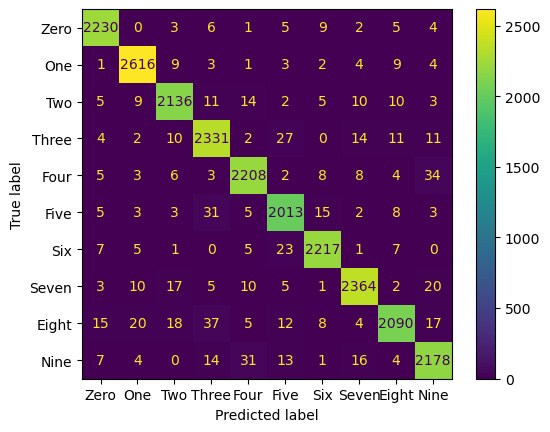

Confusion Matrix of dataset 0 for model 1 is: 


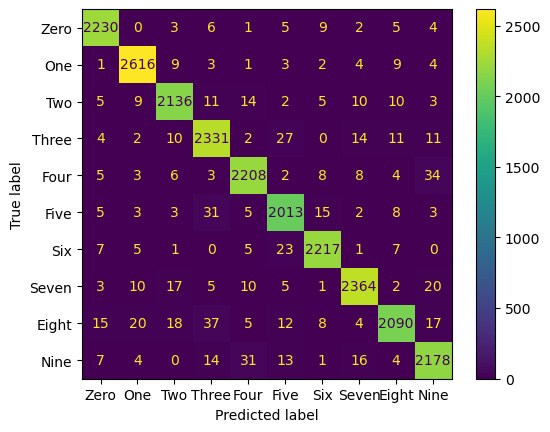

Confusion Matrix of dataset 0 for model 2 is: 


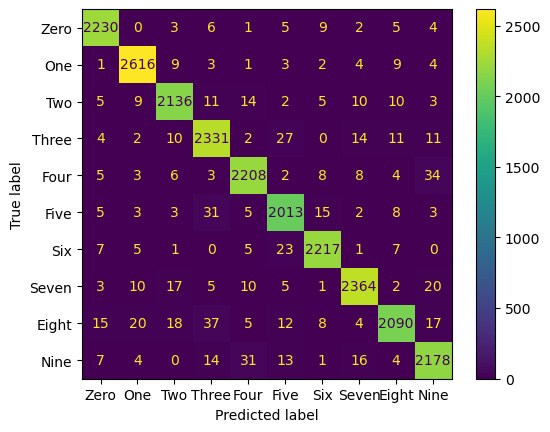

Confusion Matrix of dataset 0 for model 3 is: 


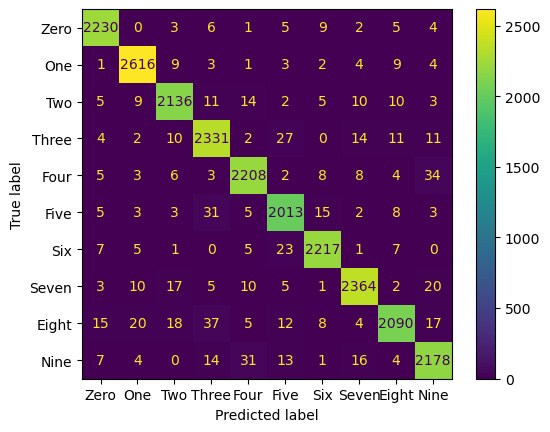

Confusion Matrix of dataset 0 for model 4 is: 


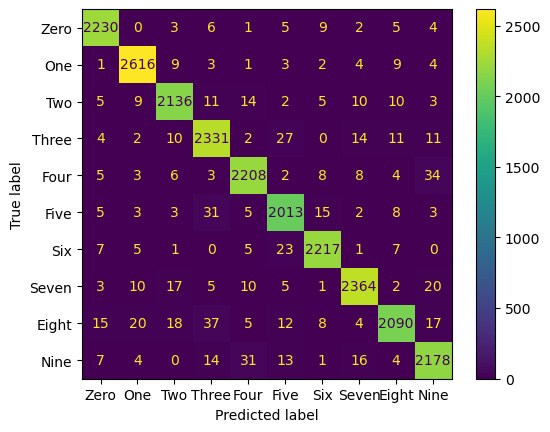

Confusion Matrix of dataset 0 for model 5 is: 


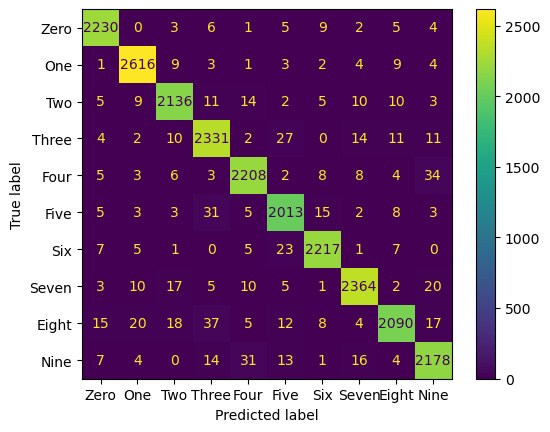

Confusion Matrix of dataset 0 for model 6 is: 


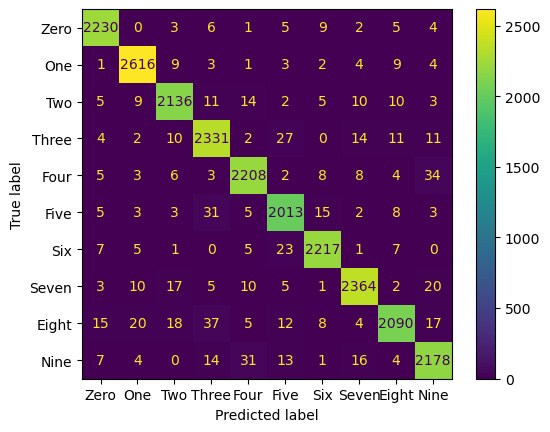

Confusion Matrix of dataset 0 for model 7 is: 


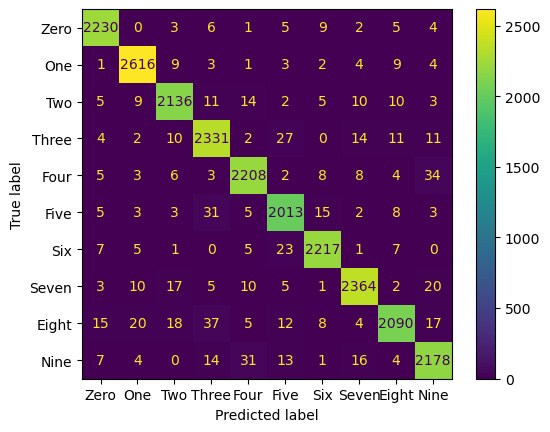

Confusion Matrix of dataset 0 for model 8 is: 


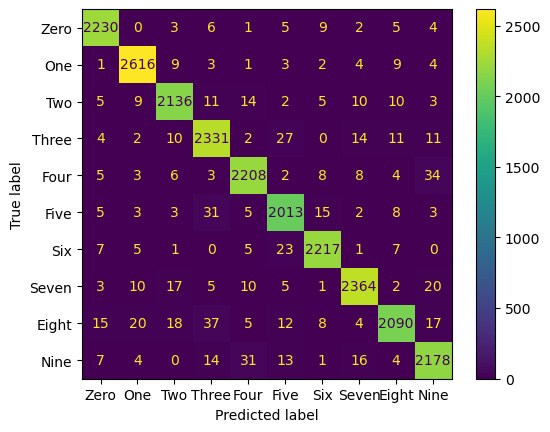

Confusion Matrix of dataset 0 for model 9 is: 


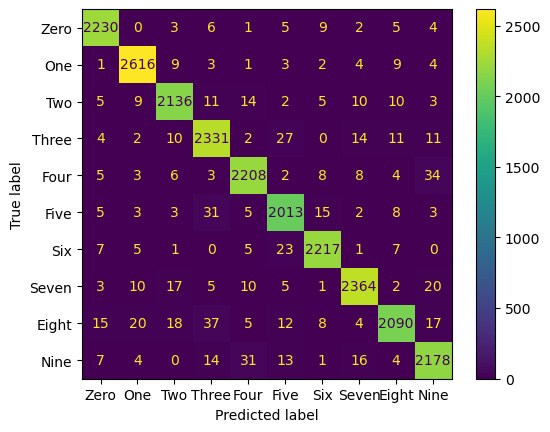

Confusion Matrix of dataset 0 for model 10 is: 


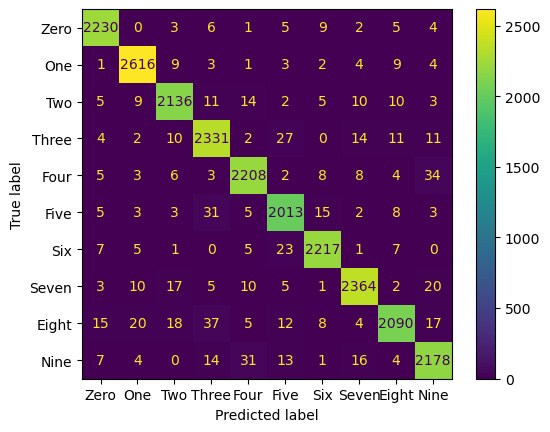

Confusion Matrix of dataset 0 for model 11 is: 


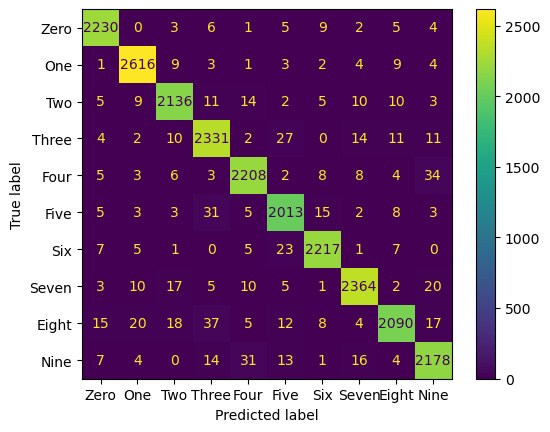

Confusion Matrix of dataset 0 for model 12 is: 


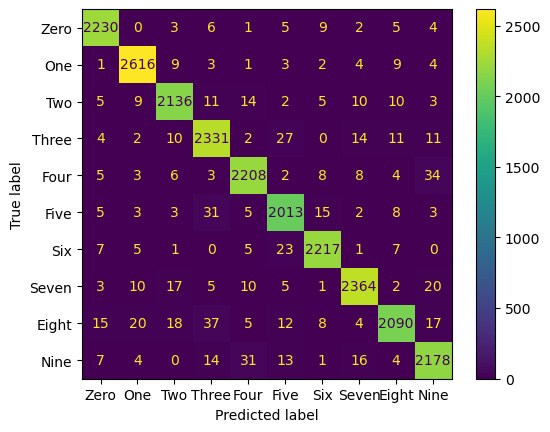

Confusion Matrix of dataset 0 for model 13 is: 


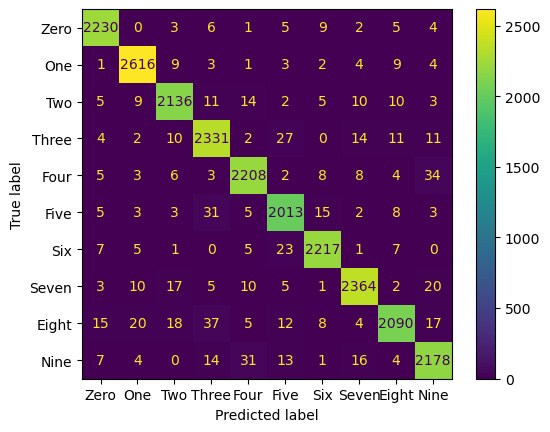

Confusion Matrix of dataset 0 for model 14 is: 


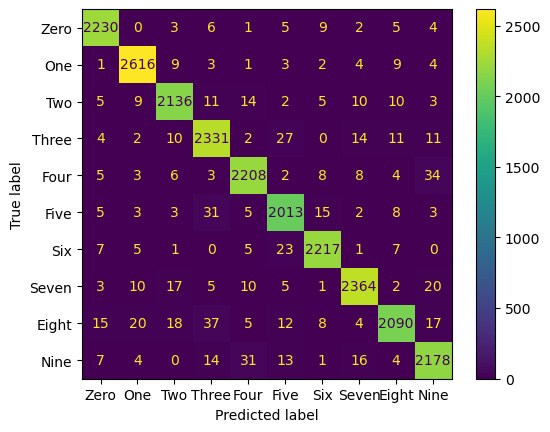

Confusion Matrix of dataset 1 for model 0 is: 


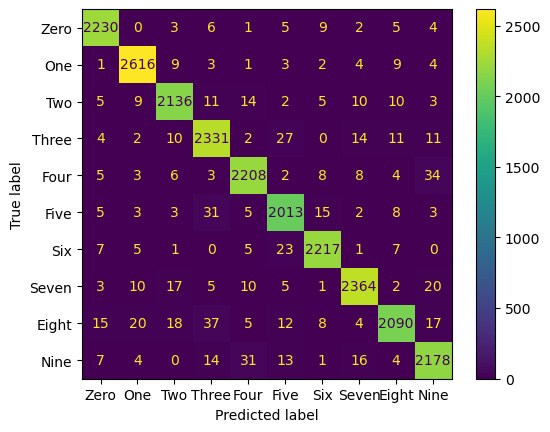

Confusion Matrix of dataset 1 for model 1 is: 


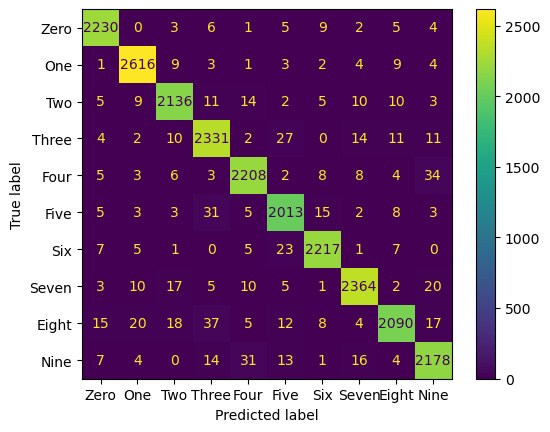

Confusion Matrix of dataset 1 for model 2 is: 


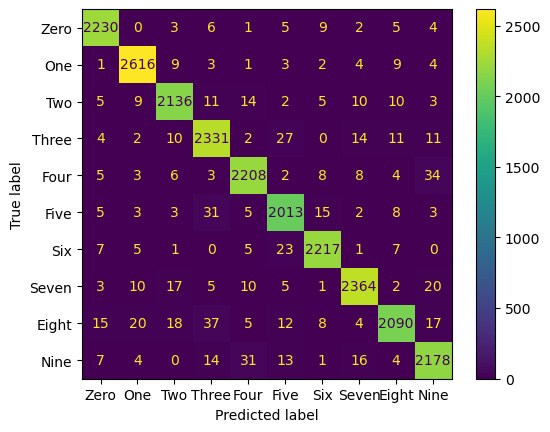

Confusion Matrix of dataset 1 for model 3 is: 


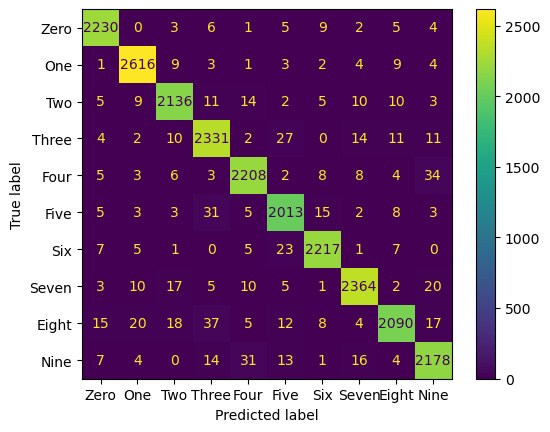

Confusion Matrix of dataset 1 for model 4 is: 


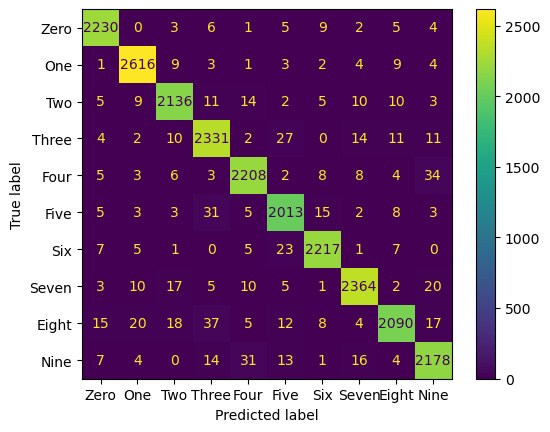

Confusion Matrix of dataset 1 for model 5 is: 


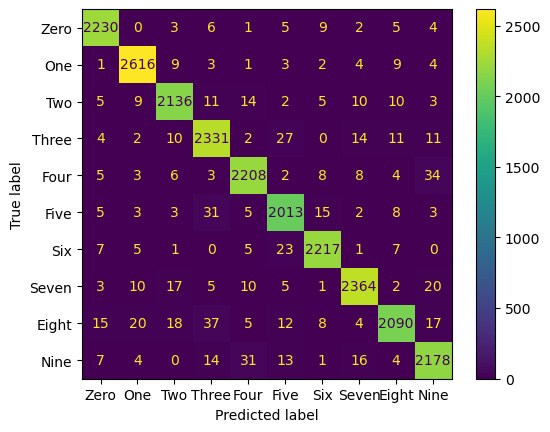

Confusion Matrix of dataset 1 for model 6 is: 


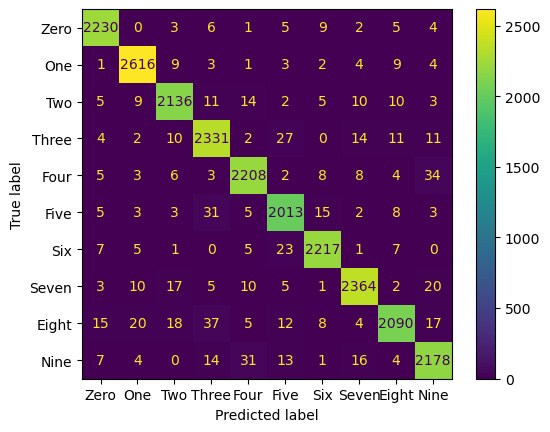

Confusion Matrix of dataset 1 for model 7 is: 


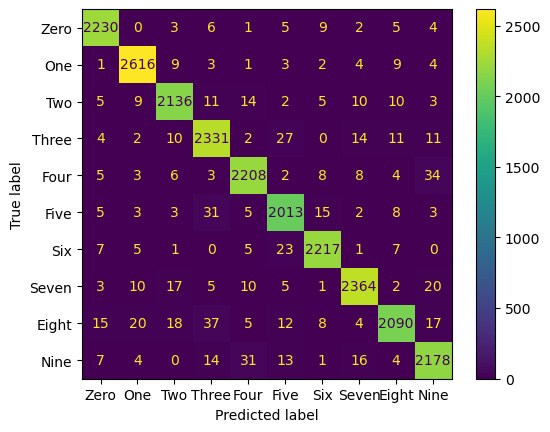

Confusion Matrix of dataset 1 for model 8 is: 


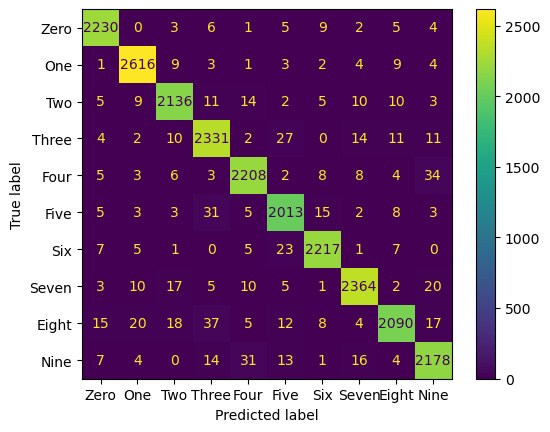

Confusion Matrix of dataset 1 for model 9 is: 


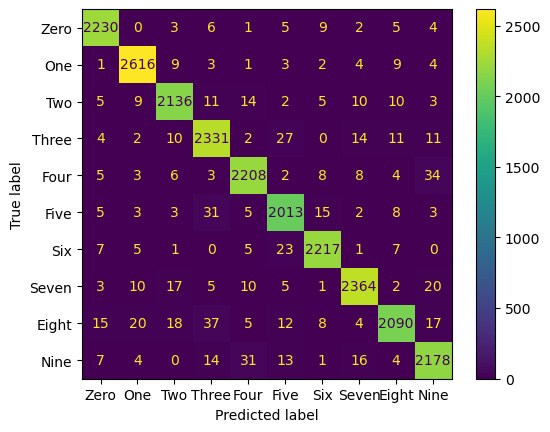

Confusion Matrix of dataset 1 for model 10 is: 


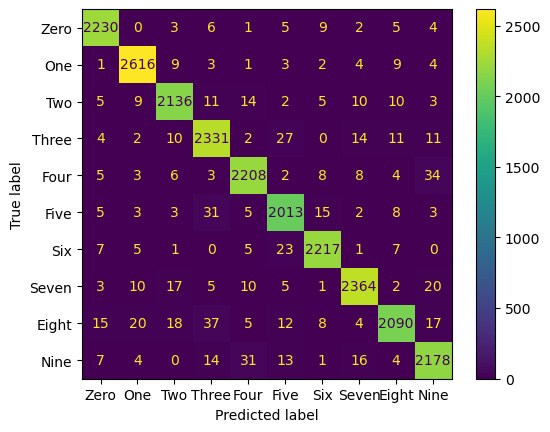

Confusion Matrix of dataset 1 for model 11 is: 


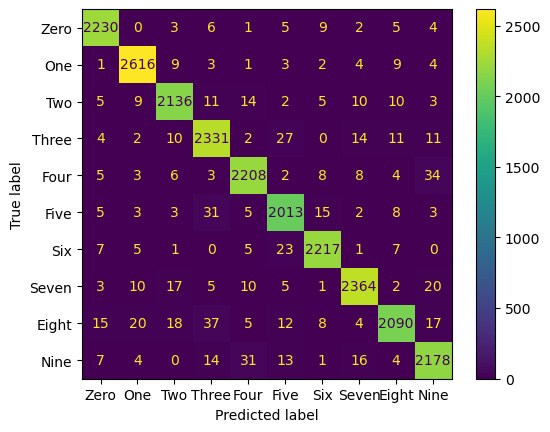

Confusion Matrix of dataset 1 for model 12 is: 


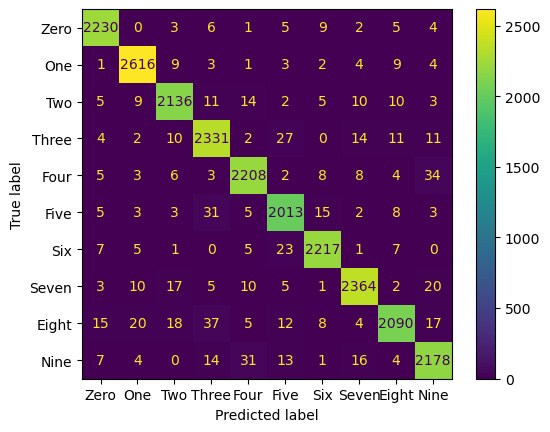

Confusion Matrix of dataset 1 for model 13 is: 


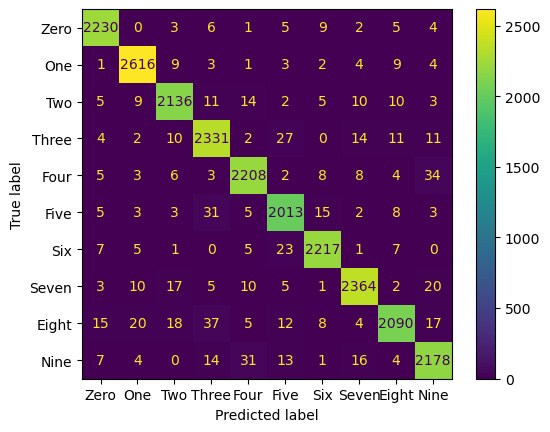

Confusion Matrix of dataset 1 for model 14 is: 


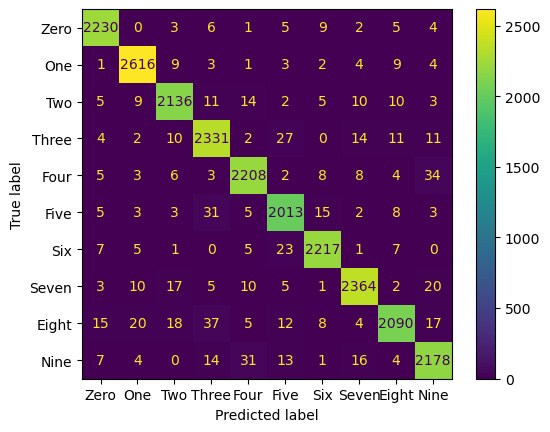

Confusion Matrix of dataset 2 for model 0 is: 


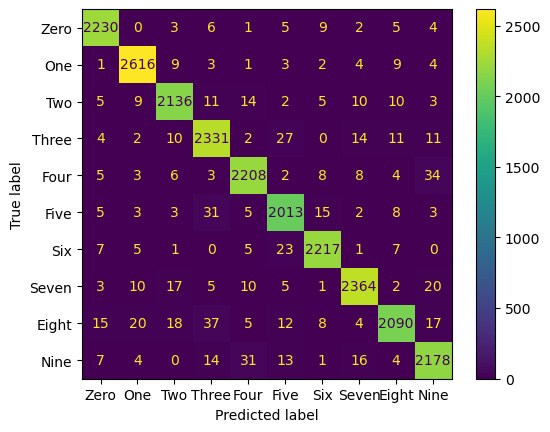

Confusion Matrix of dataset 2 for model 1 is: 


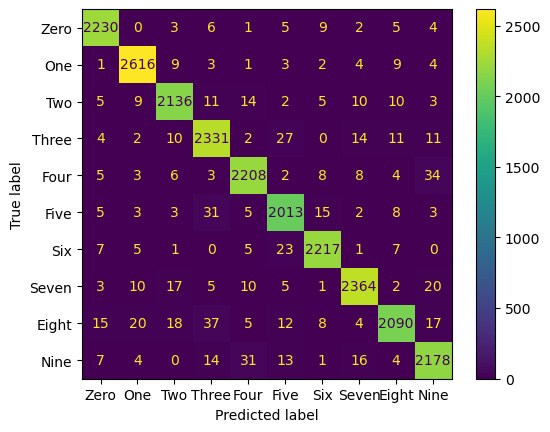

Confusion Matrix of dataset 2 for model 2 is: 


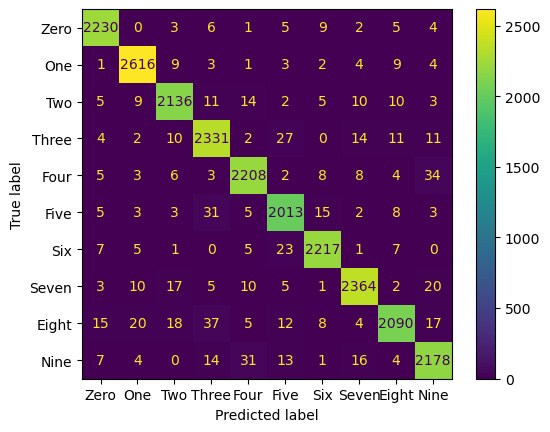

Confusion Matrix of dataset 2 for model 3 is: 


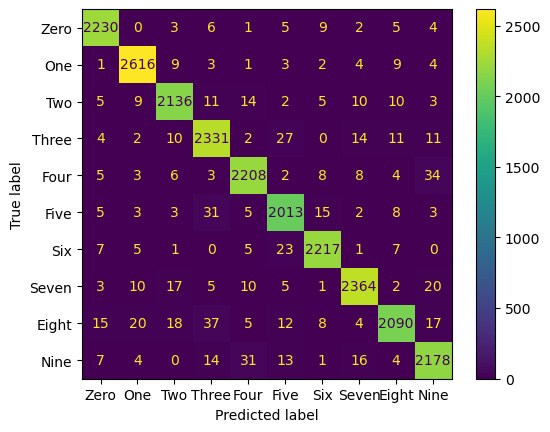

Confusion Matrix of dataset 2 for model 4 is: 


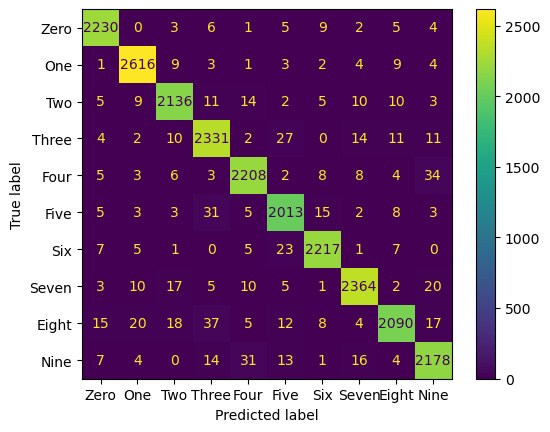

Confusion Matrix of dataset 2 for model 5 is: 


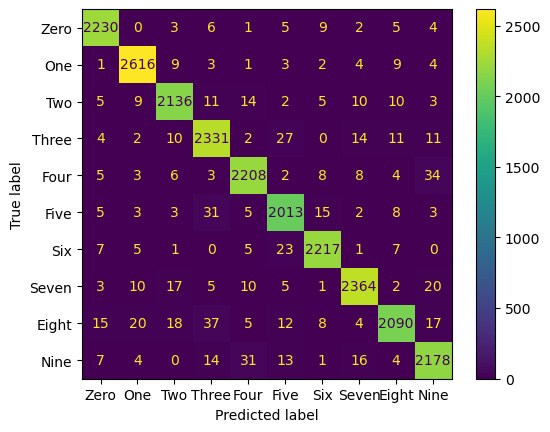

Confusion Matrix of dataset 2 for model 6 is: 


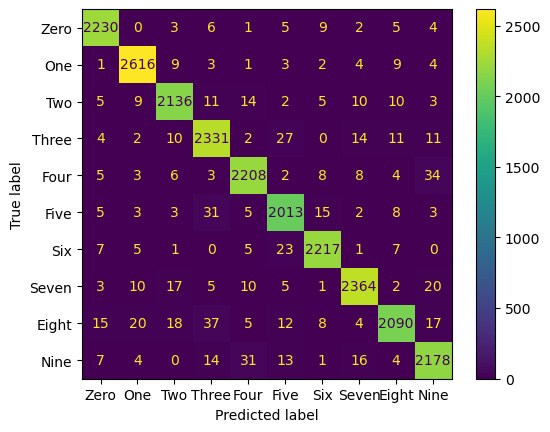

Confusion Matrix of dataset 2 for model 7 is: 


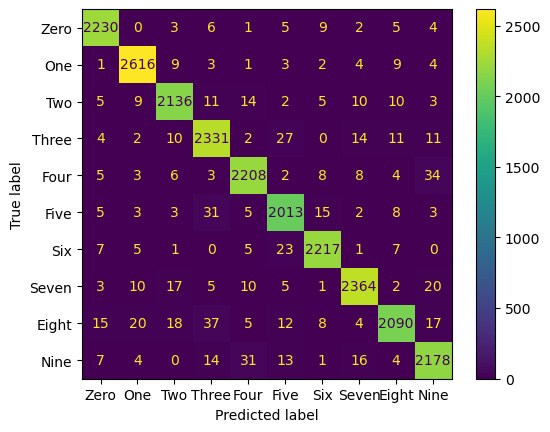

Confusion Matrix of dataset 2 for model 8 is: 


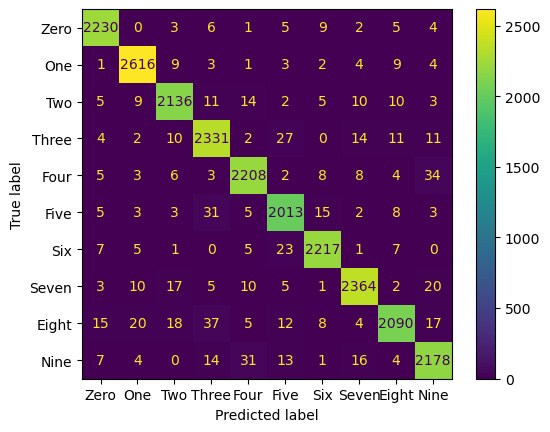

Confusion Matrix of dataset 2 for model 9 is: 


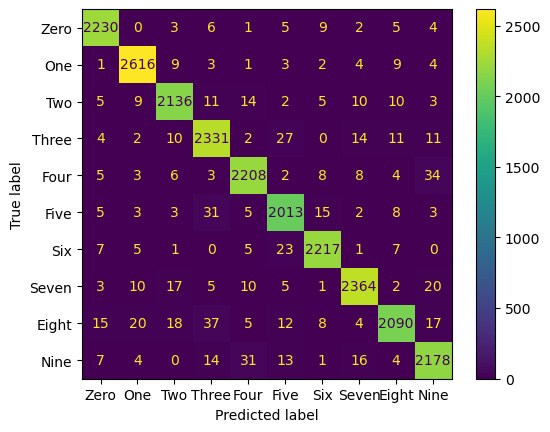

Confusion Matrix of dataset 2 for model 10 is: 


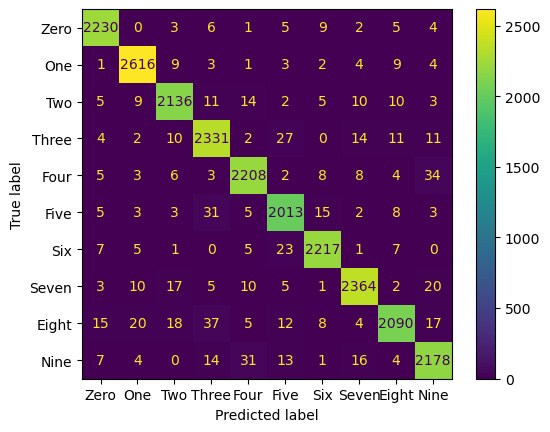

Confusion Matrix of dataset 2 for model 11 is: 


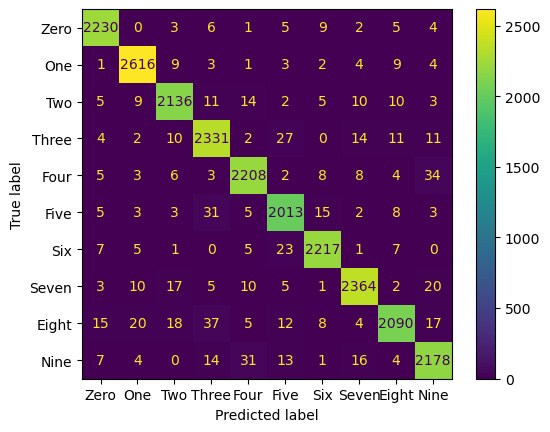

Confusion Matrix of dataset 2 for model 12 is: 


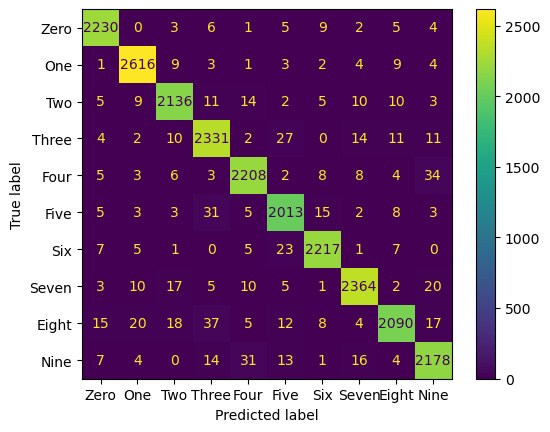

Confusion Matrix of dataset 2 for model 13 is: 


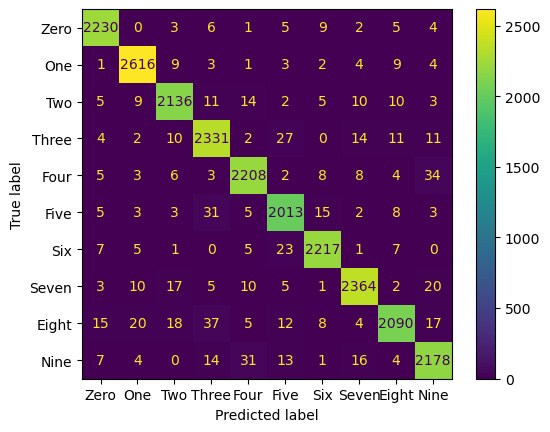

Confusion Matrix of dataset 2 for model 14 is: 


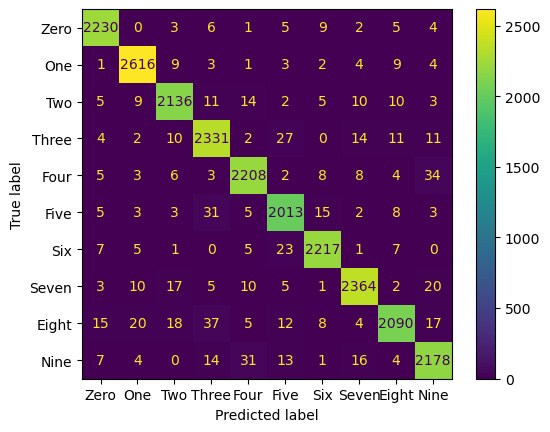

Confusion Matrix of dataset 3 for model 0 is: 


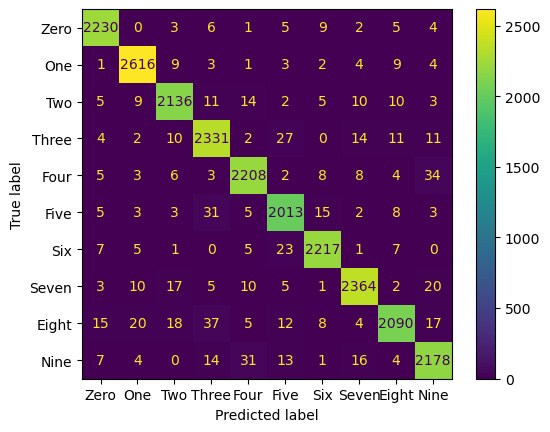

Confusion Matrix of dataset 3 for model 1 is: 


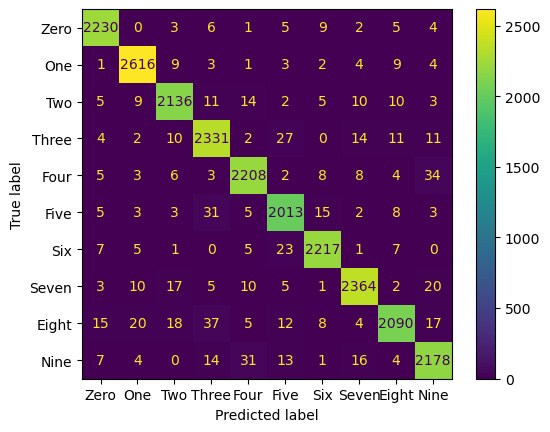

Confusion Matrix of dataset 3 for model 2 is: 


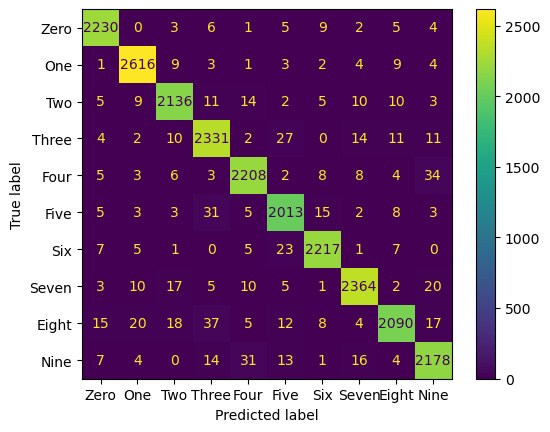

Confusion Matrix of dataset 3 for model 3 is: 


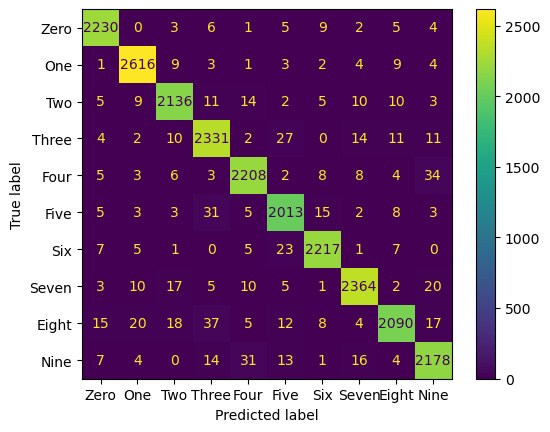

Confusion Matrix of dataset 3 for model 4 is: 


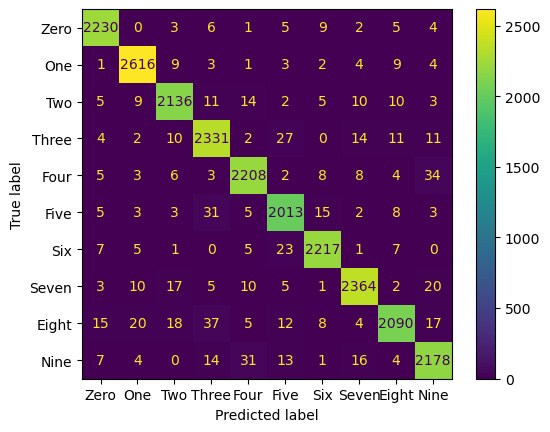

Confusion Matrix of dataset 3 for model 5 is: 


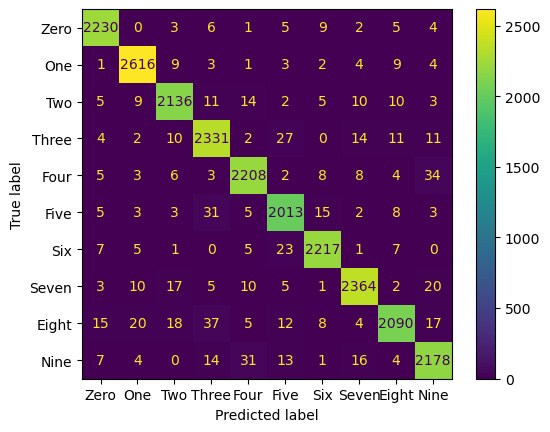

Confusion Matrix of dataset 3 for model 6 is: 


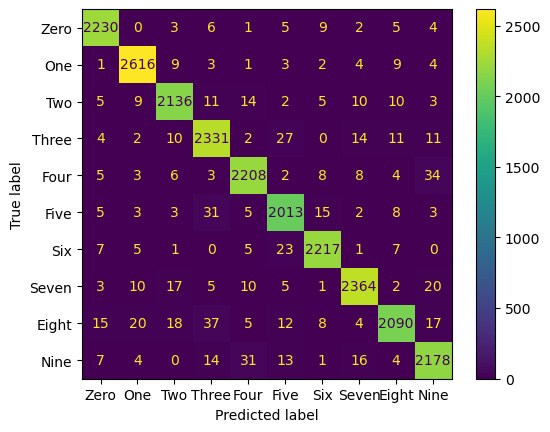

Confusion Matrix of dataset 3 for model 7 is: 


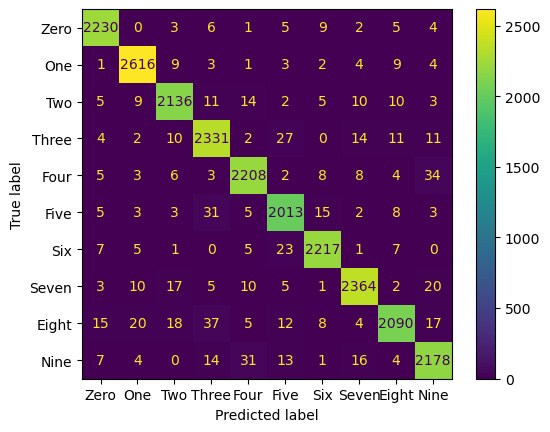

Confusion Matrix of dataset 3 for model 8 is: 


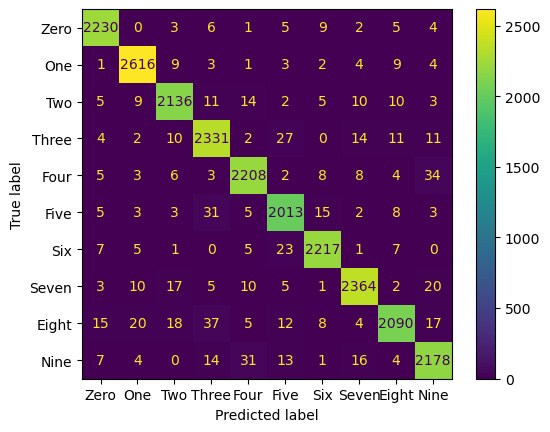

Confusion Matrix of dataset 3 for model 9 is: 


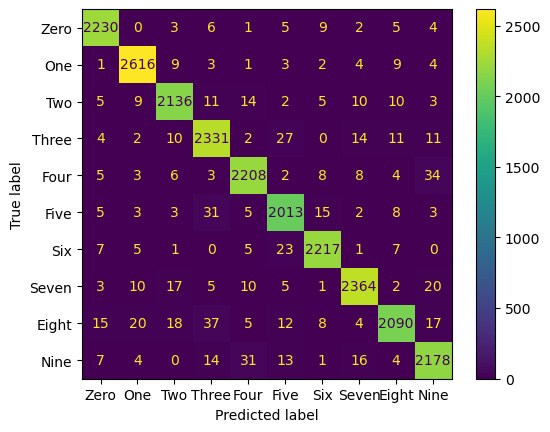

Confusion Matrix of dataset 3 for model 10 is: 


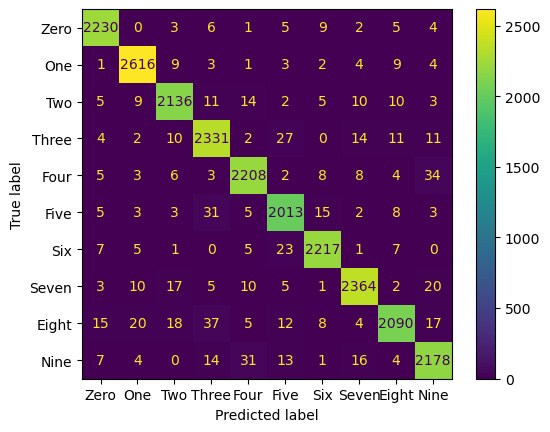

Confusion Matrix of dataset 3 for model 11 is: 


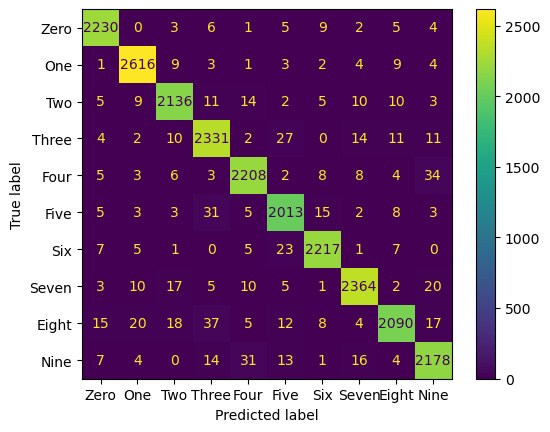

Confusion Matrix of dataset 3 for model 12 is: 


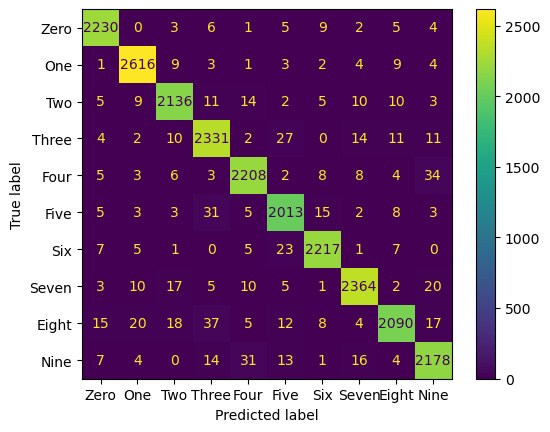

Confusion Matrix of dataset 3 for model 13 is: 


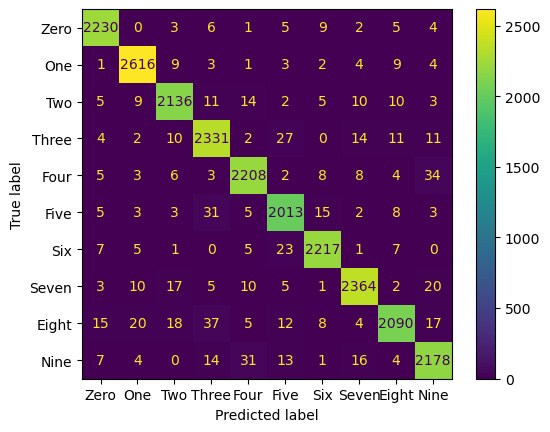

Confusion Matrix of dataset 3 for model 14 is: 


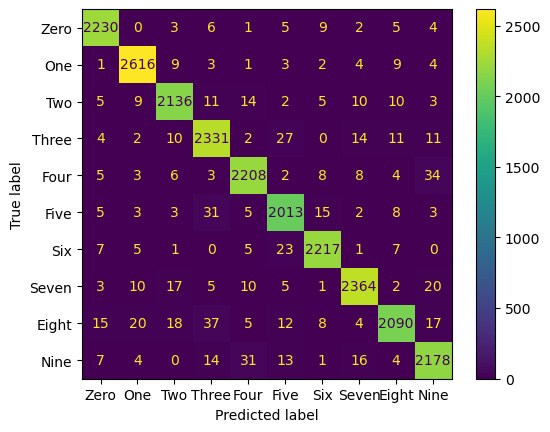

Confusion Matrix of dataset 4 for model 0 is: 


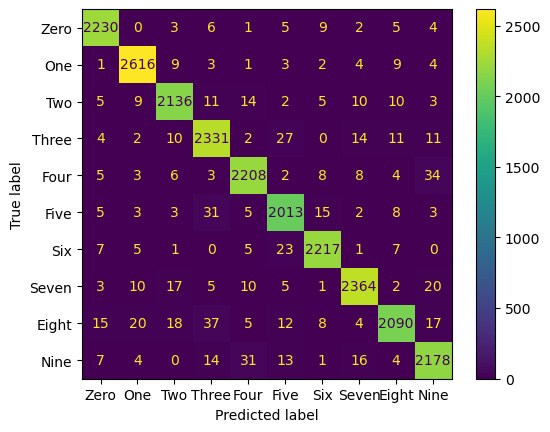

Confusion Matrix of dataset 4 for model 1 is: 


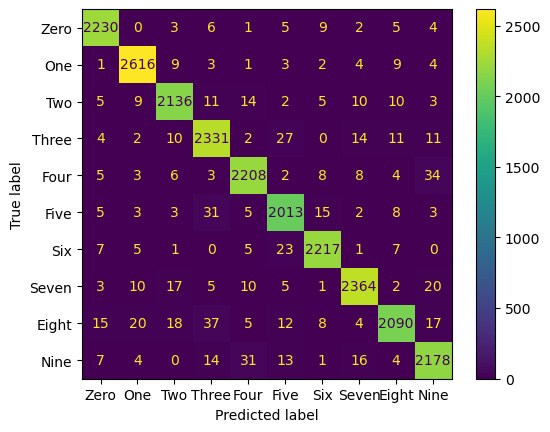

Confusion Matrix of dataset 4 for model 2 is: 


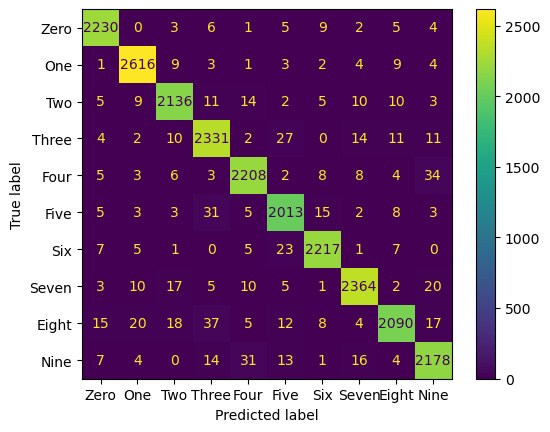

Confusion Matrix of dataset 4 for model 3 is: 


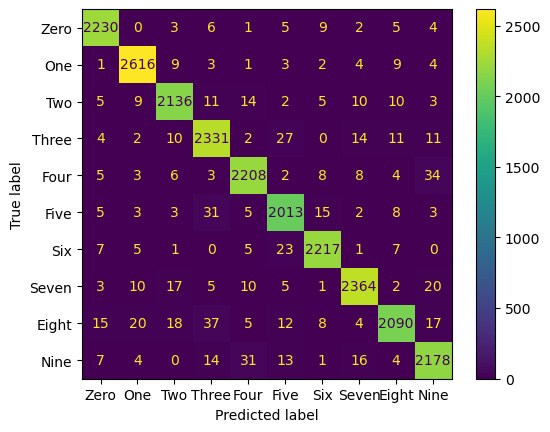

Confusion Matrix of dataset 4 for model 4 is: 


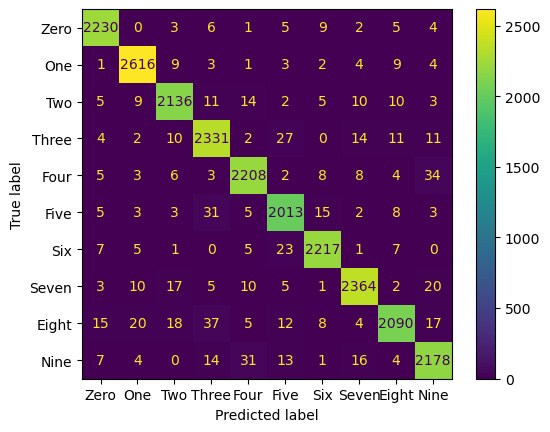

Confusion Matrix of dataset 4 for model 5 is: 


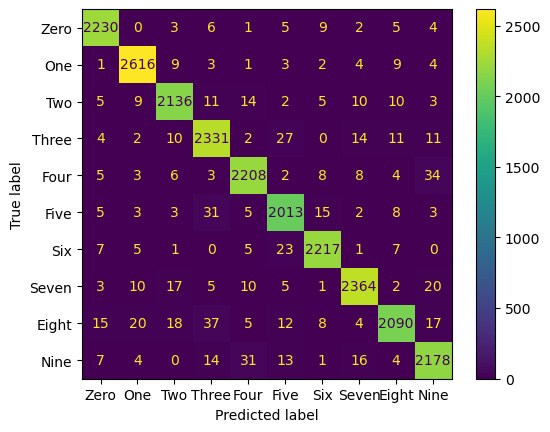

Confusion Matrix of dataset 4 for model 6 is: 


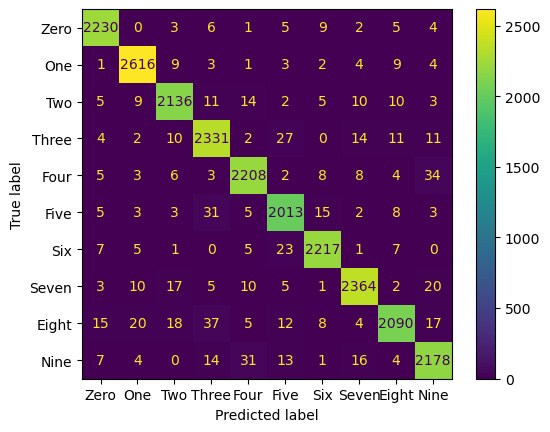

Confusion Matrix of dataset 4 for model 7 is: 


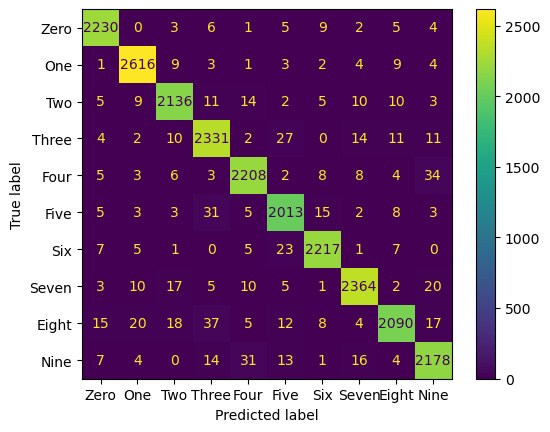

Confusion Matrix of dataset 4 for model 8 is: 


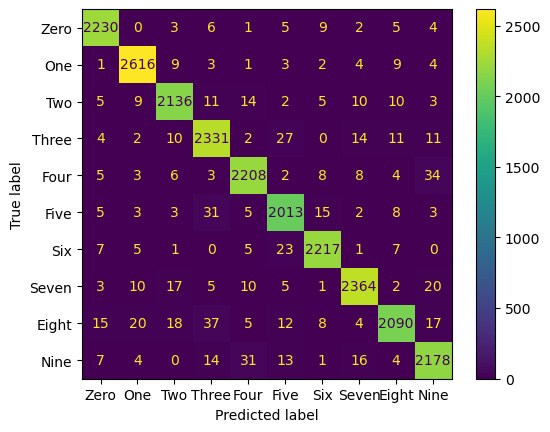

Confusion Matrix of dataset 4 for model 9 is: 


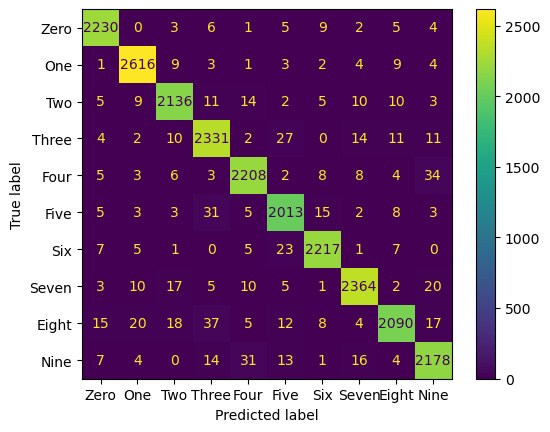

Confusion Matrix of dataset 4 for model 10 is: 


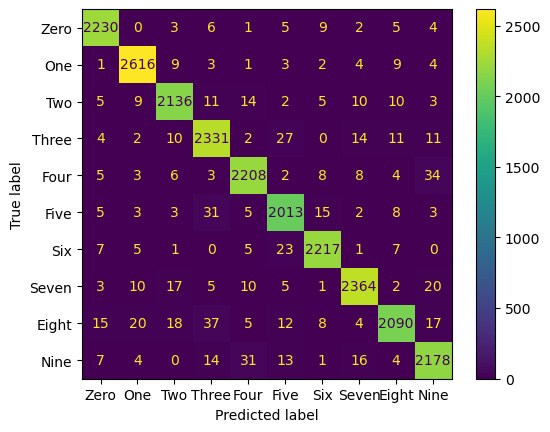

Confusion Matrix of dataset 4 for model 11 is: 


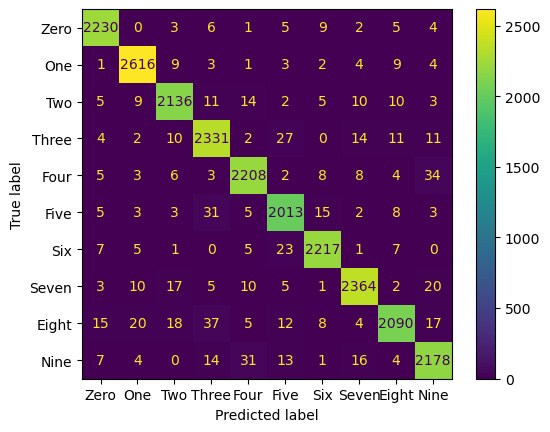

Confusion Matrix of dataset 4 for model 12 is: 


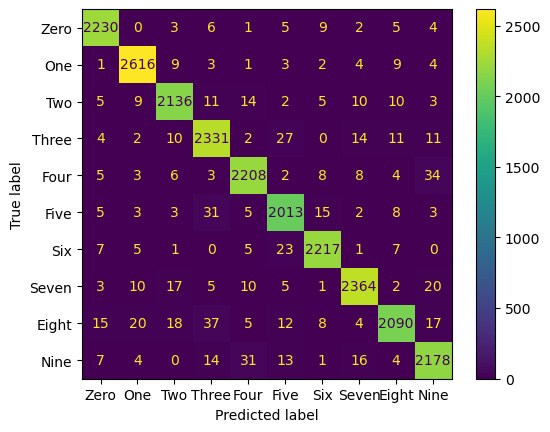

Confusion Matrix of dataset 4 for model 13 is: 


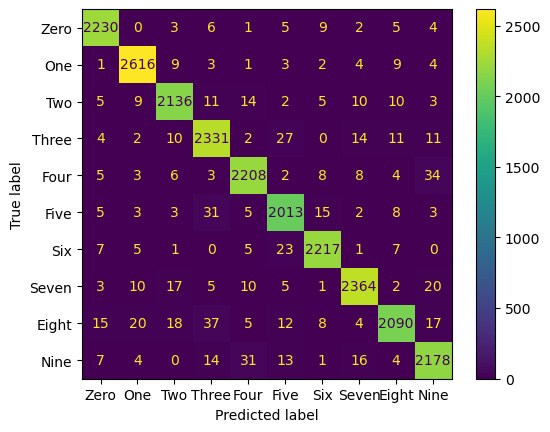

Confusion Matrix of dataset 4 for model 14 is: 


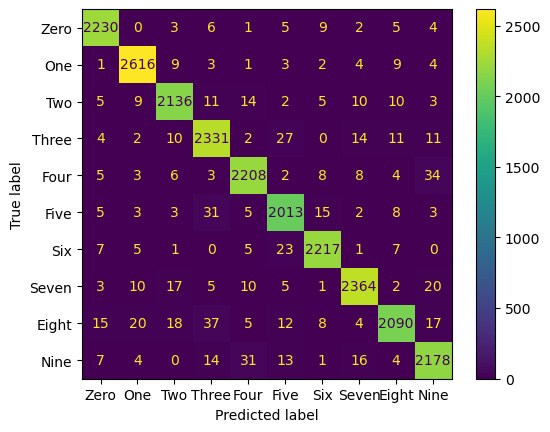

Confusion Matrix of dataset 5 for model 0 is: 


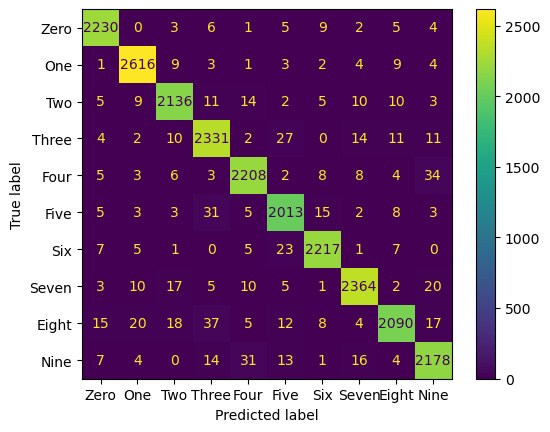

Confusion Matrix of dataset 5 for model 1 is: 


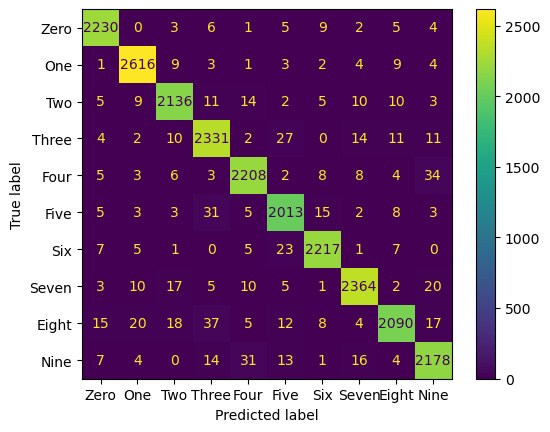

Confusion Matrix of dataset 5 for model 2 is: 


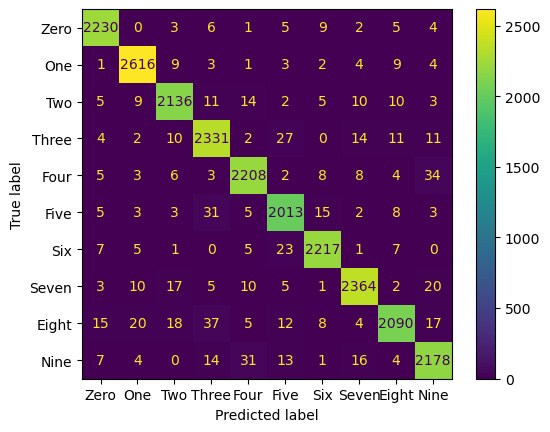

Confusion Matrix of dataset 5 for model 3 is: 


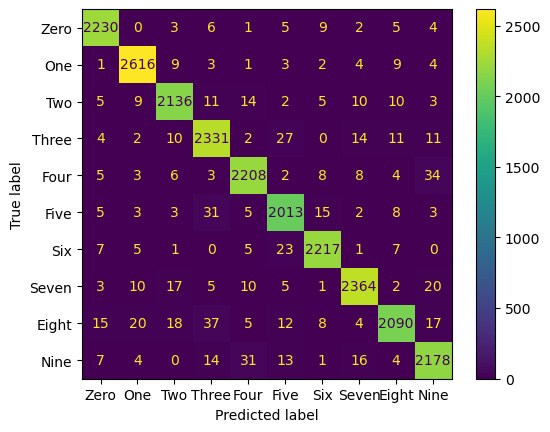

Confusion Matrix of dataset 5 for model 4 is: 


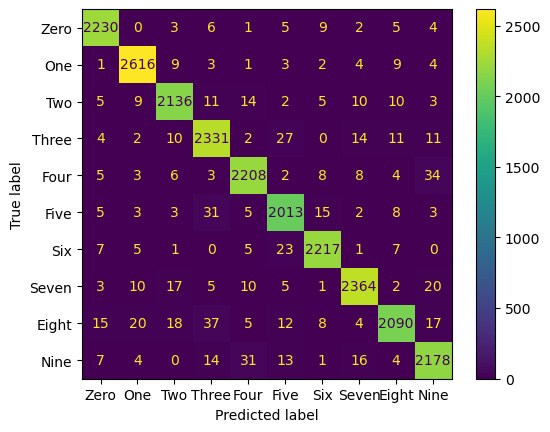

Confusion Matrix of dataset 5 for model 5 is: 


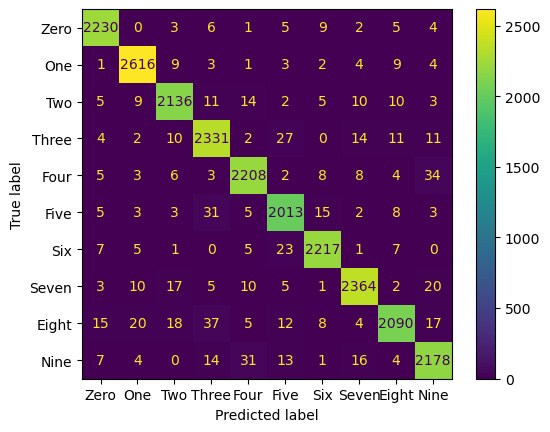

Confusion Matrix of dataset 5 for model 6 is: 


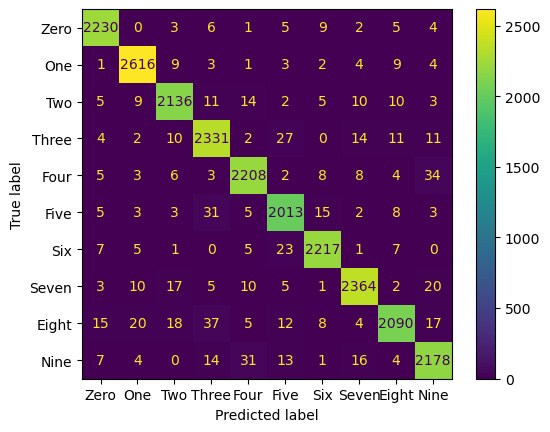

Confusion Matrix of dataset 5 for model 7 is: 


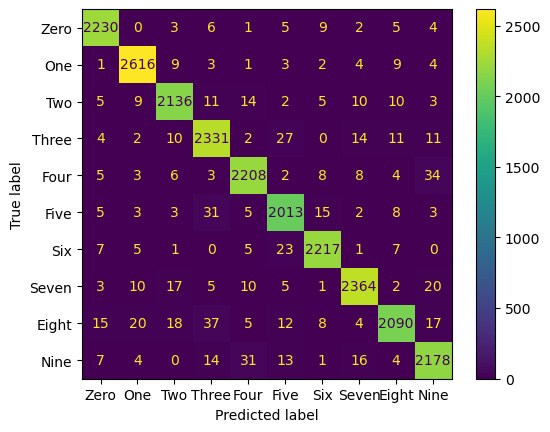

Confusion Matrix of dataset 5 for model 8 is: 


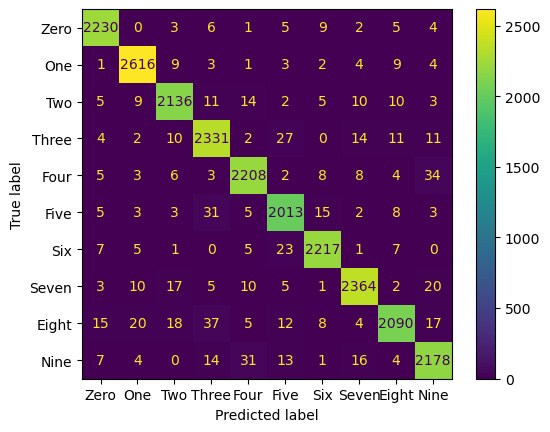

Confusion Matrix of dataset 5 for model 9 is: 


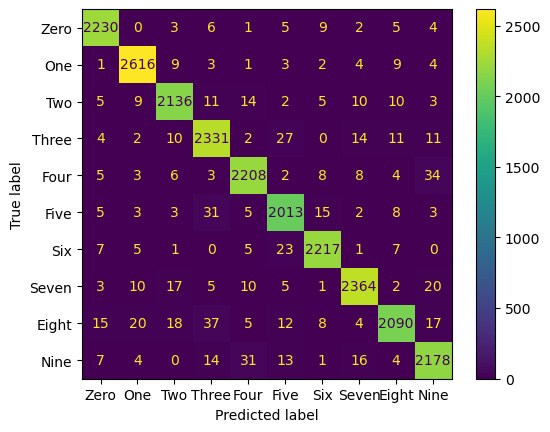

Confusion Matrix of dataset 5 for model 10 is: 


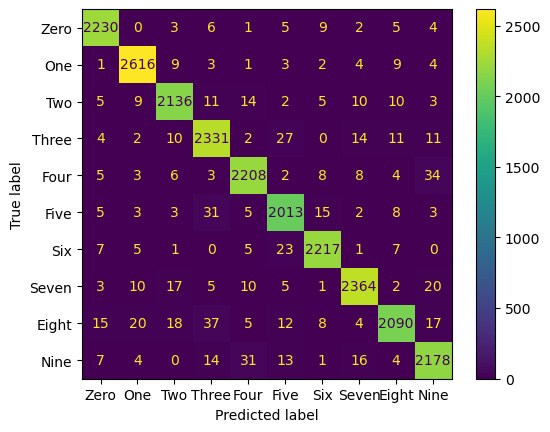

Confusion Matrix of dataset 5 for model 11 is: 


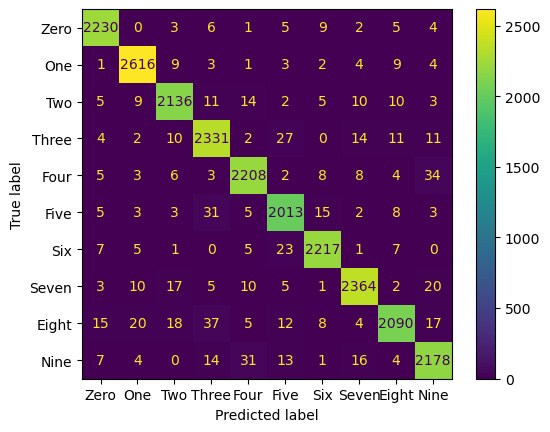

Confusion Matrix of dataset 5 for model 12 is: 


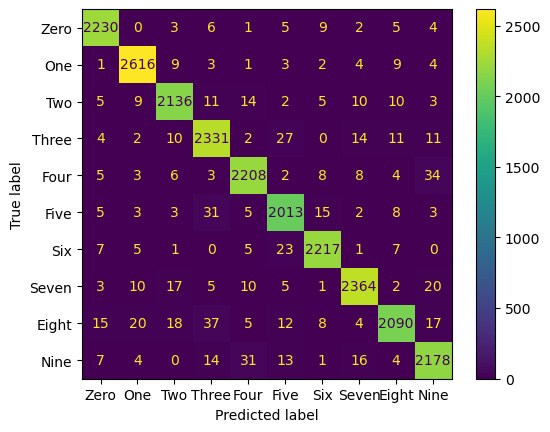

Confusion Matrix of dataset 5 for model 13 is: 


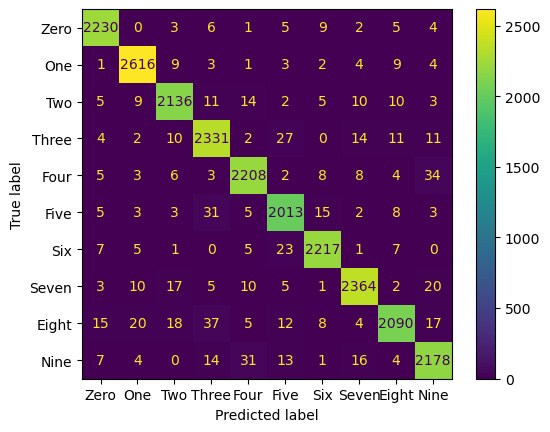

Confusion Matrix of dataset 5 for model 14 is: 


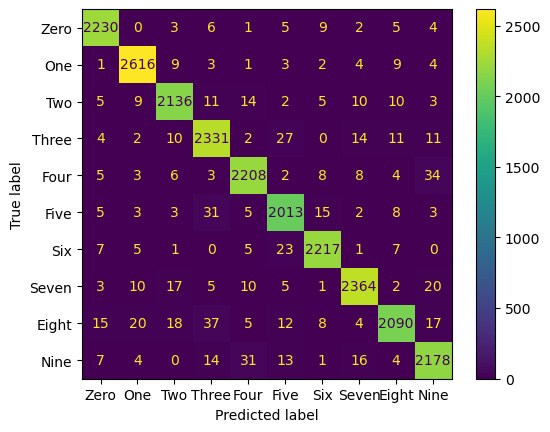

Confusion Matrix of dataset 6 for model 0 is: 


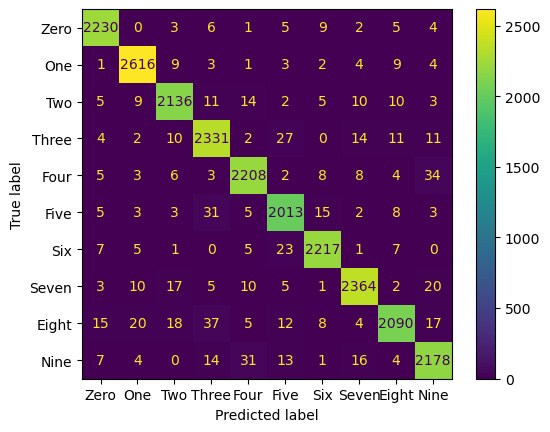

Confusion Matrix of dataset 6 for model 1 is: 


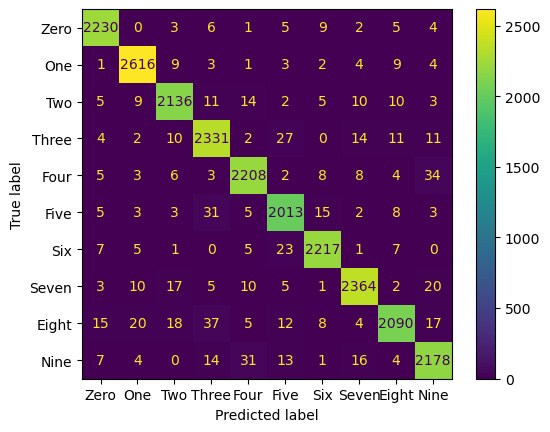

Confusion Matrix of dataset 6 for model 2 is: 


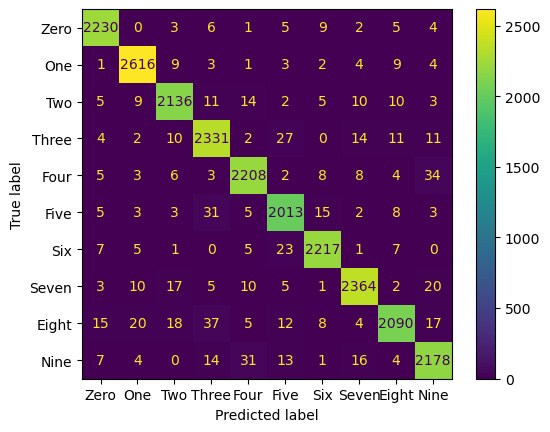

Confusion Matrix of dataset 6 for model 3 is: 


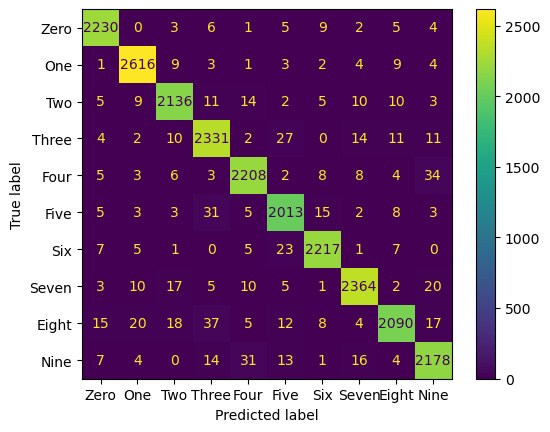

Confusion Matrix of dataset 6 for model 4 is: 


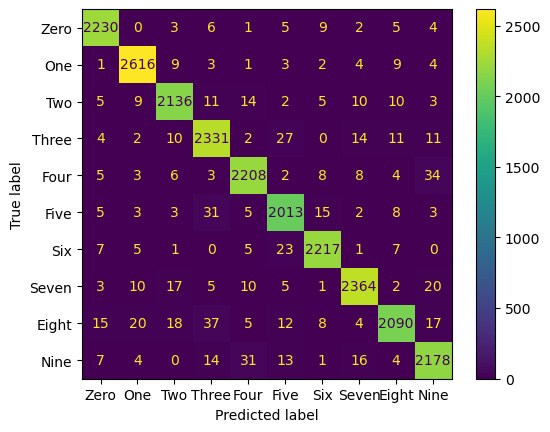

Confusion Matrix of dataset 6 for model 5 is: 


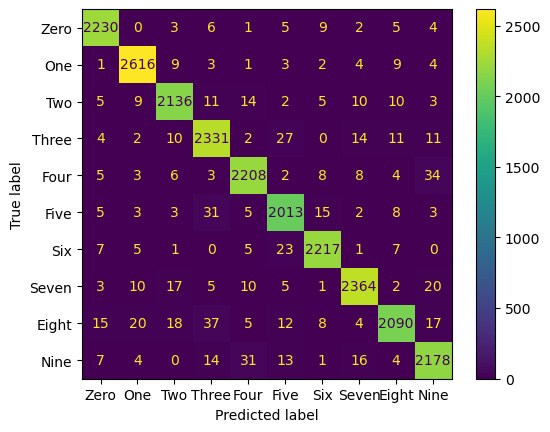

Confusion Matrix of dataset 6 for model 6 is: 


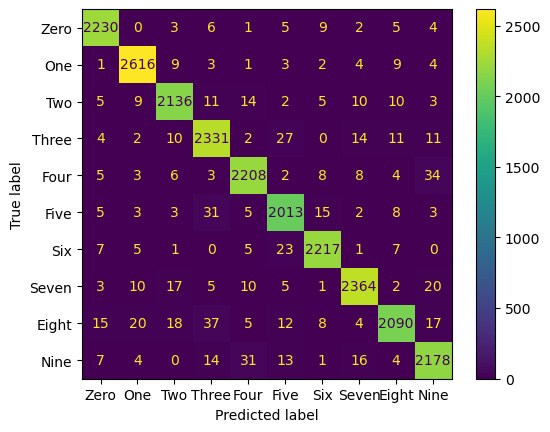

Confusion Matrix of dataset 6 for model 7 is: 


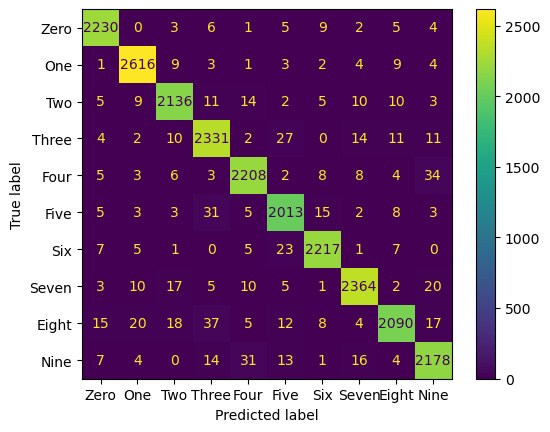

Confusion Matrix of dataset 6 for model 8 is: 


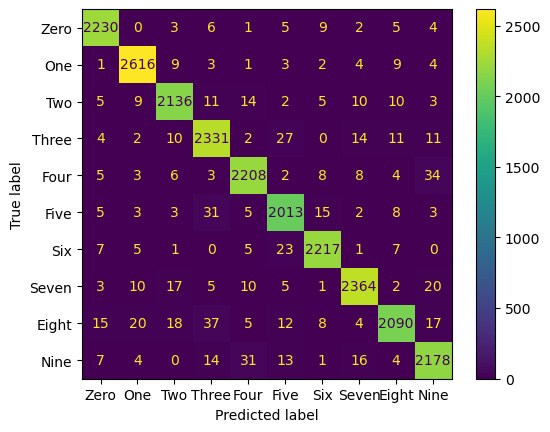

Confusion Matrix of dataset 6 for model 9 is: 


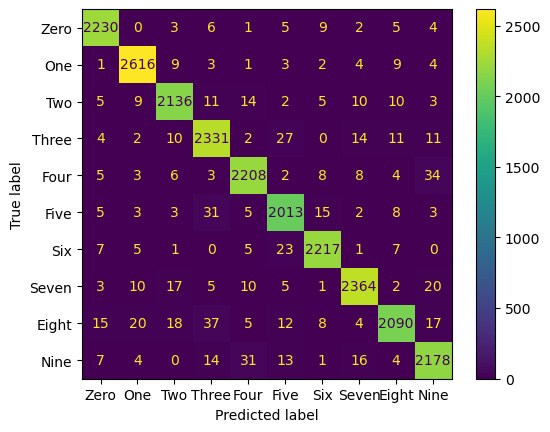

Confusion Matrix of dataset 6 for model 10 is: 


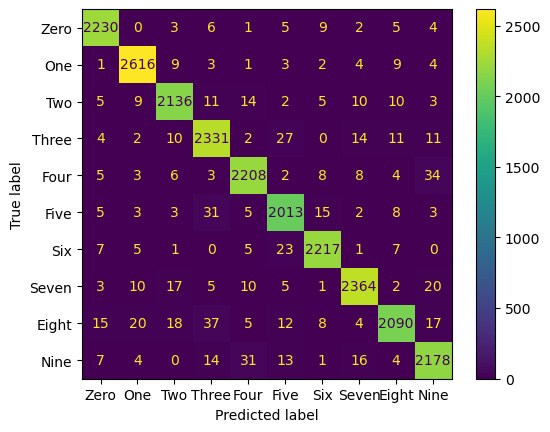

Confusion Matrix of dataset 6 for model 11 is: 


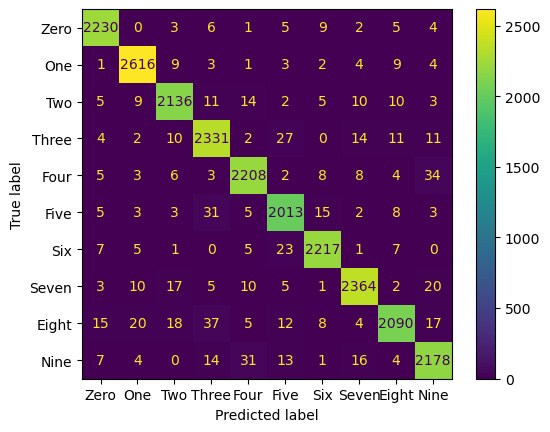

Confusion Matrix of dataset 6 for model 12 is: 


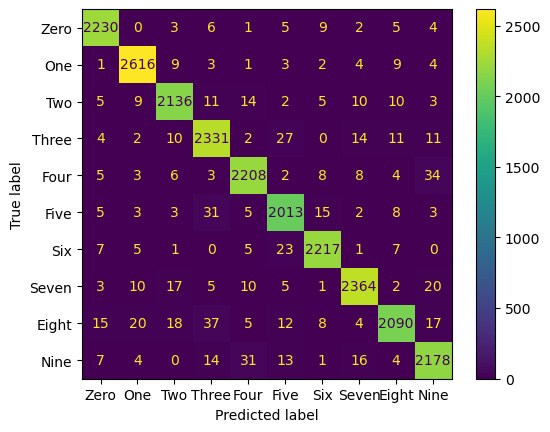

Confusion Matrix of dataset 6 for model 13 is: 


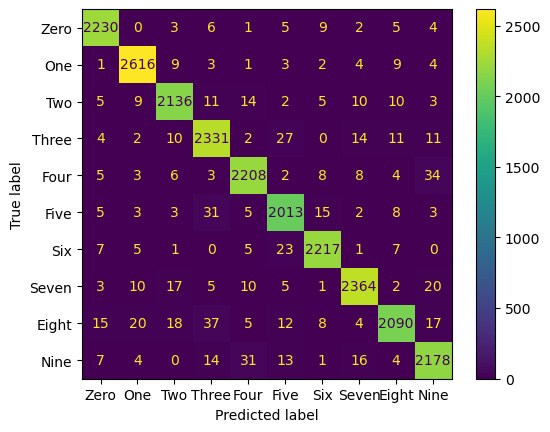

Confusion Matrix of dataset 6 for model 14 is: 


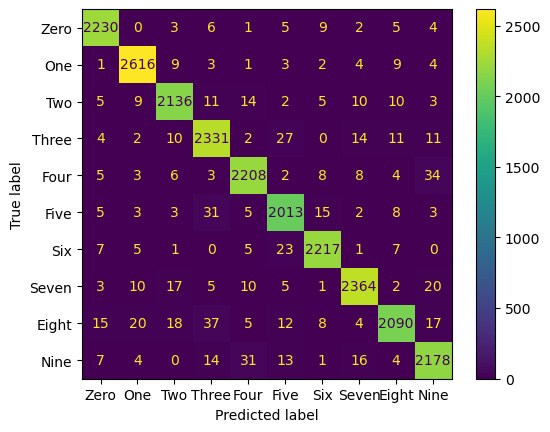

Confusion Matrix of dataset 7 for model 0 is: 


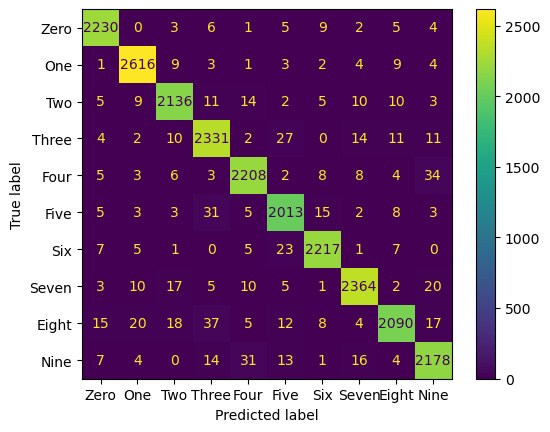

Confusion Matrix of dataset 7 for model 1 is: 


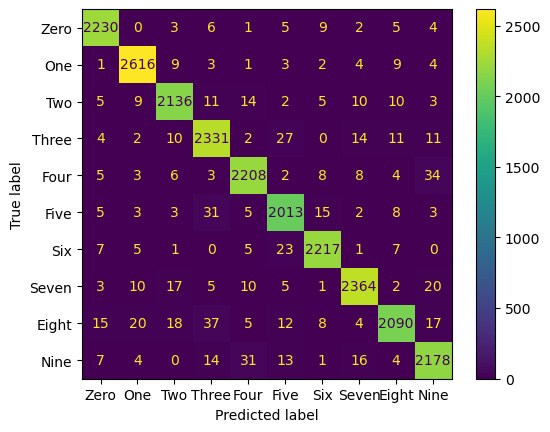

Confusion Matrix of dataset 7 for model 2 is: 


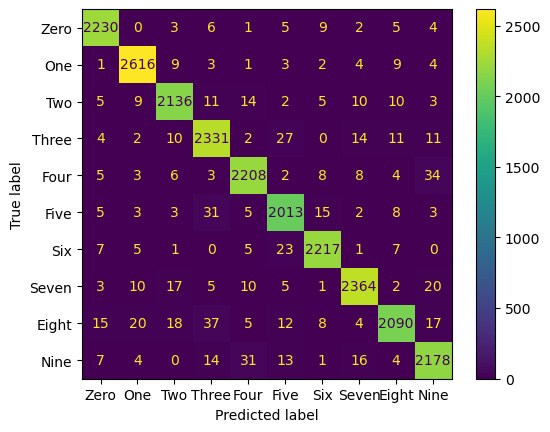

Confusion Matrix of dataset 7 for model 3 is: 


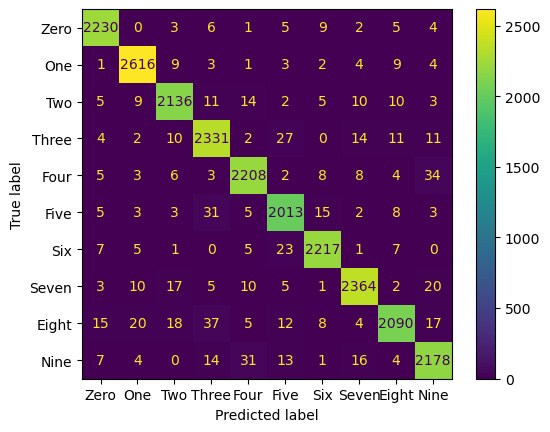

Confusion Matrix of dataset 7 for model 4 is: 


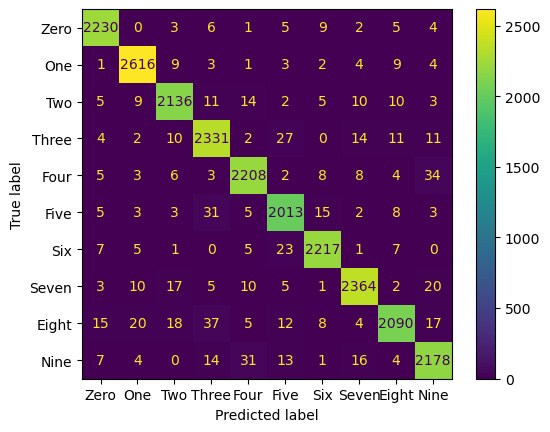

Confusion Matrix of dataset 7 for model 5 is: 


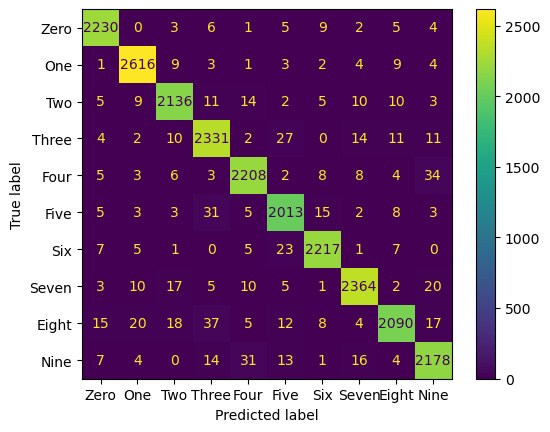

Confusion Matrix of dataset 7 for model 6 is: 


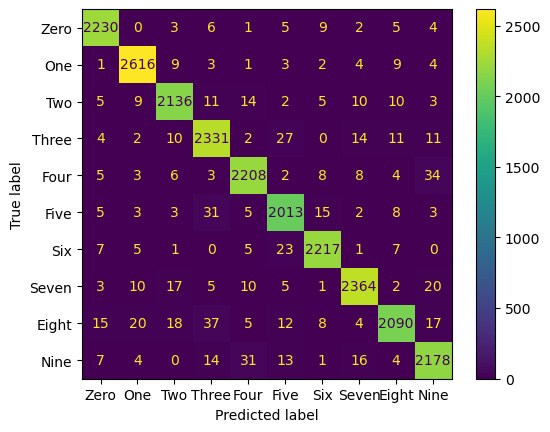

Confusion Matrix of dataset 7 for model 7 is: 


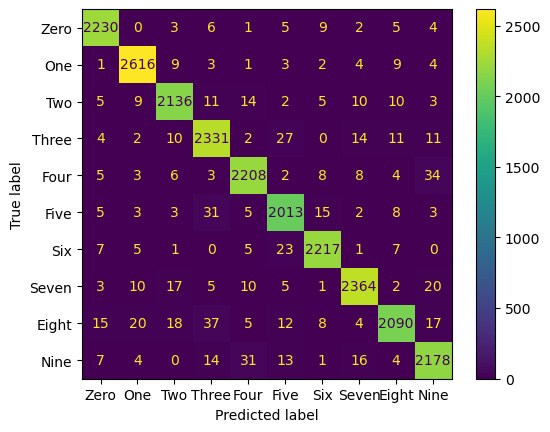

Confusion Matrix of dataset 7 for model 8 is: 


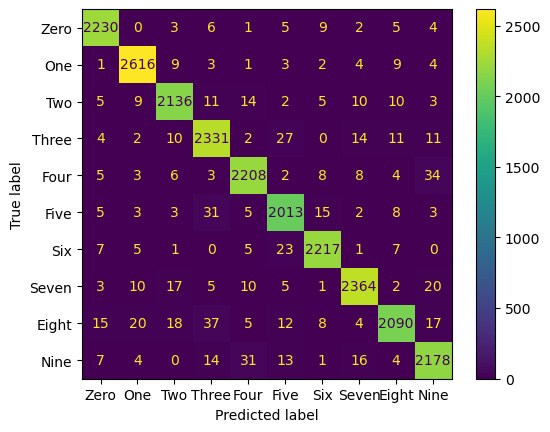

Confusion Matrix of dataset 7 for model 9 is: 


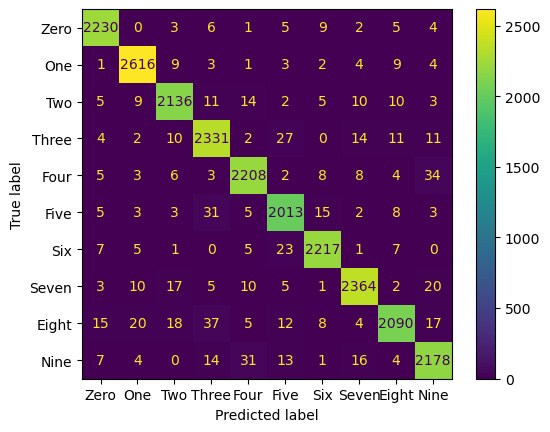

Confusion Matrix of dataset 7 for model 10 is: 


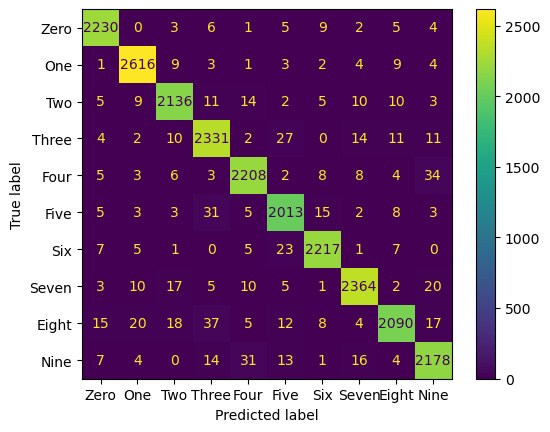

Confusion Matrix of dataset 7 for model 11 is: 


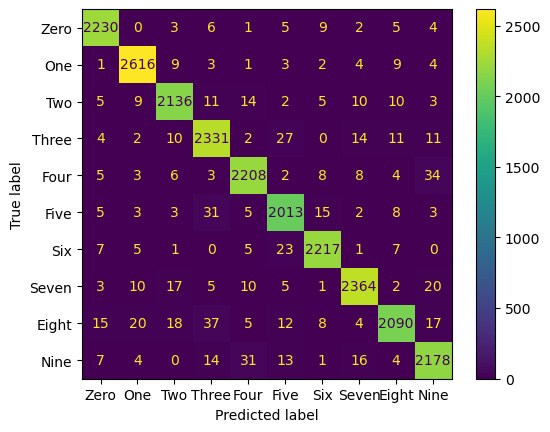

Confusion Matrix of dataset 7 for model 12 is: 


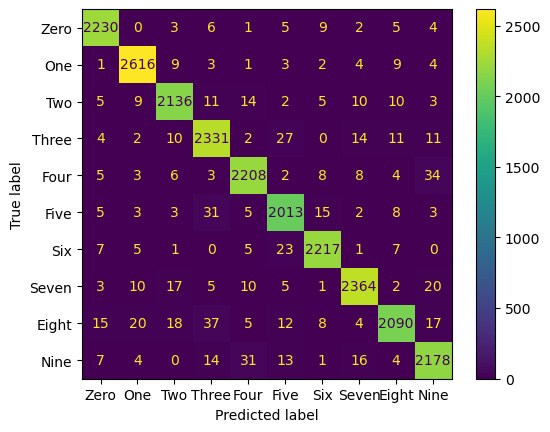

Confusion Matrix of dataset 7 for model 13 is: 


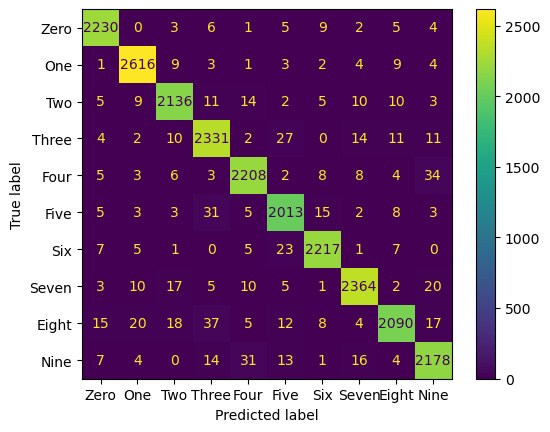

Confusion Matrix of dataset 7 for model 14 is: 


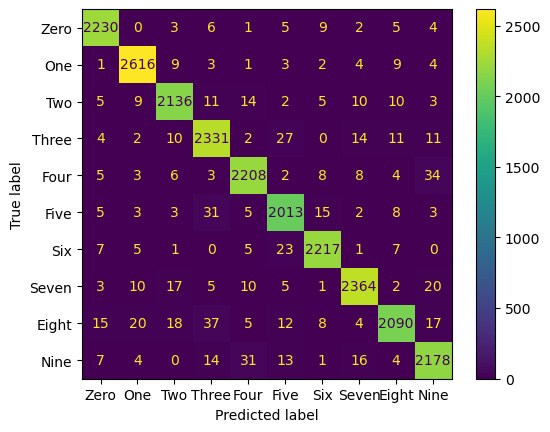

Confusion Matrix of dataset 8 for model 0 is: 


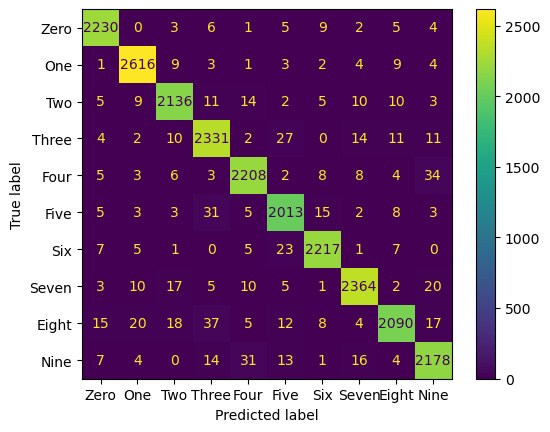

Confusion Matrix of dataset 8 for model 1 is: 


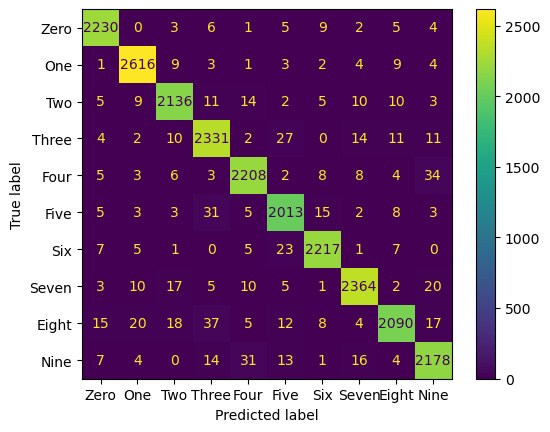

Confusion Matrix of dataset 8 for model 2 is: 


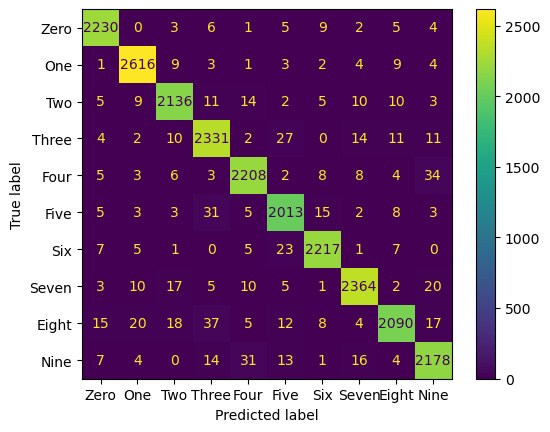

Confusion Matrix of dataset 8 for model 3 is: 


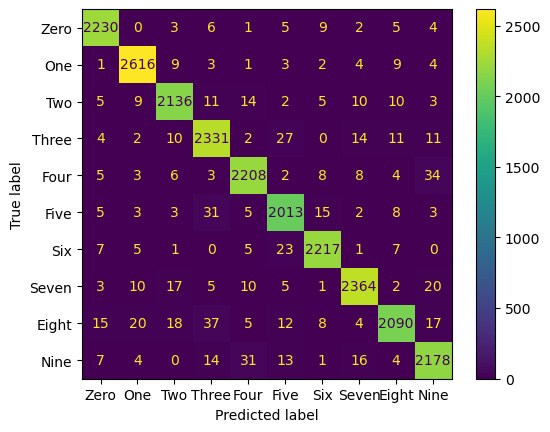

Confusion Matrix of dataset 8 for model 4 is: 


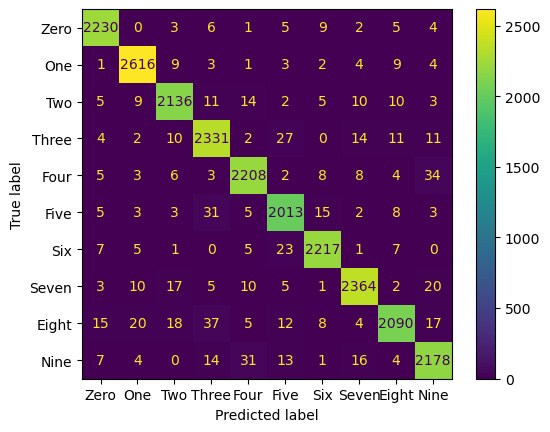

Confusion Matrix of dataset 8 for model 5 is: 


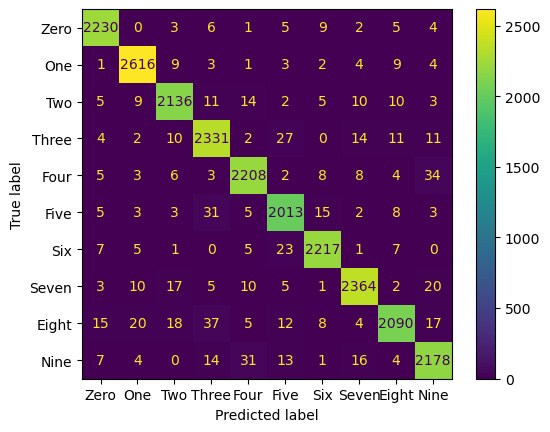

Confusion Matrix of dataset 8 for model 6 is: 


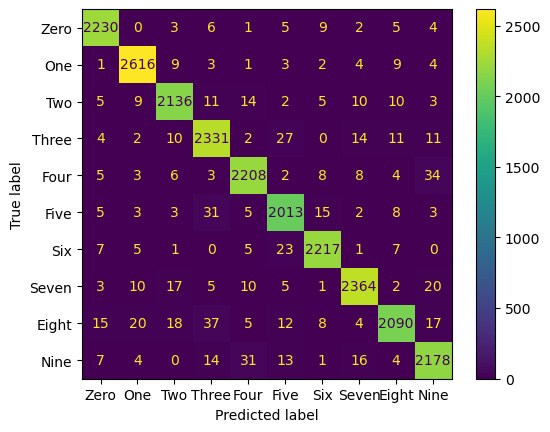

Confusion Matrix of dataset 8 for model 7 is: 


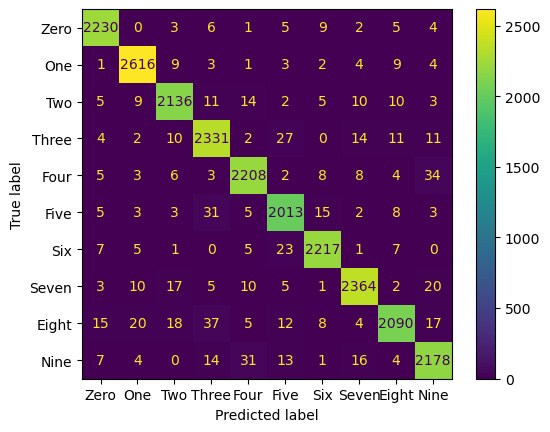

Confusion Matrix of dataset 8 for model 8 is: 


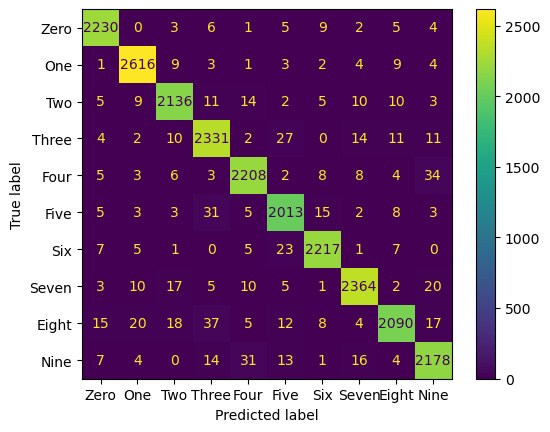

Confusion Matrix of dataset 8 for model 9 is: 


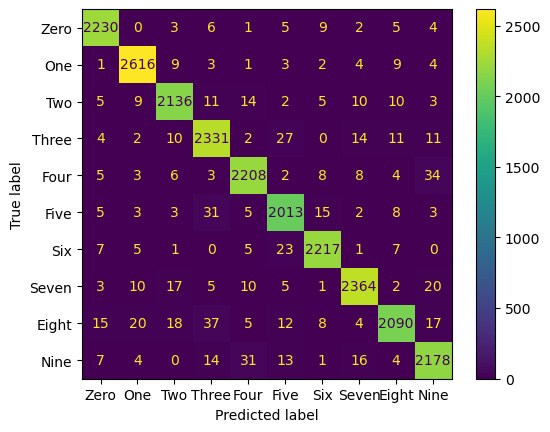

Confusion Matrix of dataset 8 for model 10 is: 


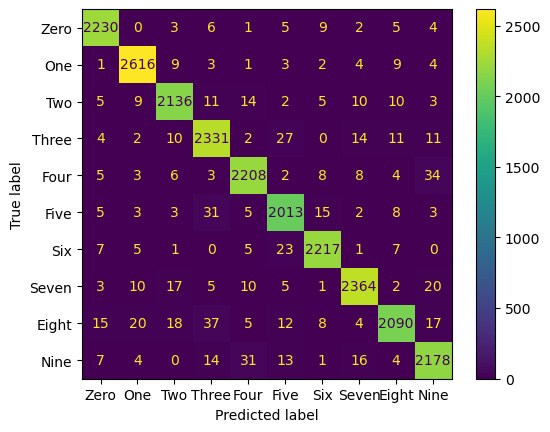

Confusion Matrix of dataset 8 for model 11 is: 


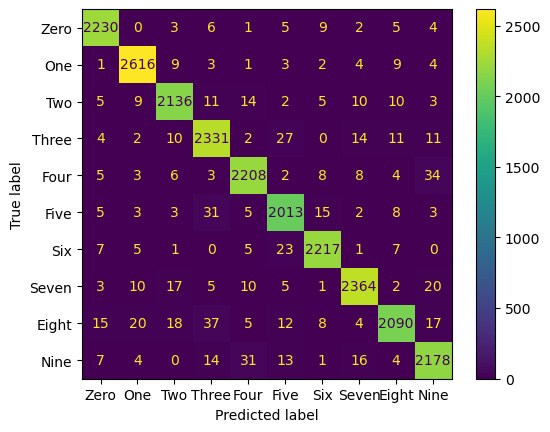

Confusion Matrix of dataset 8 for model 12 is: 


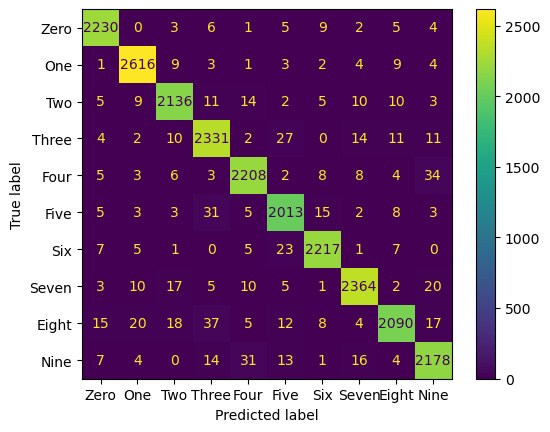

Confusion Matrix of dataset 8 for model 13 is: 


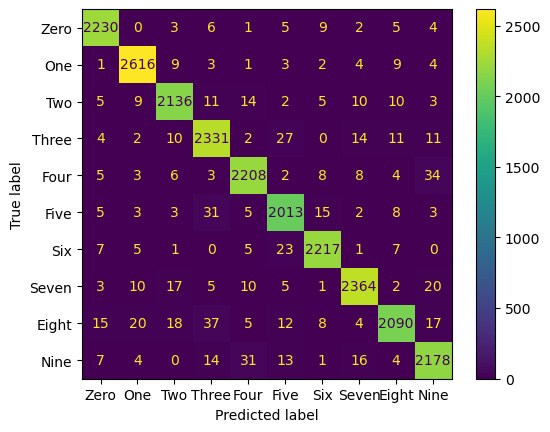

Confusion Matrix of dataset 8 for model 14 is: 


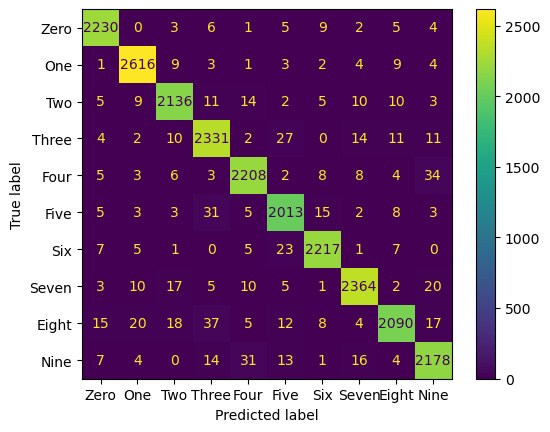

Confusion Matrix of dataset 9 for model 0 is: 


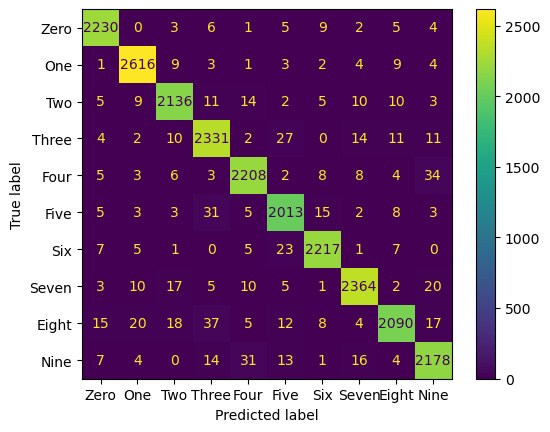

Confusion Matrix of dataset 9 for model 1 is: 


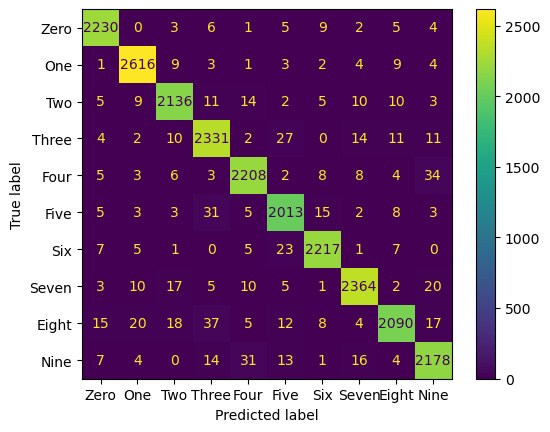

Confusion Matrix of dataset 9 for model 2 is: 


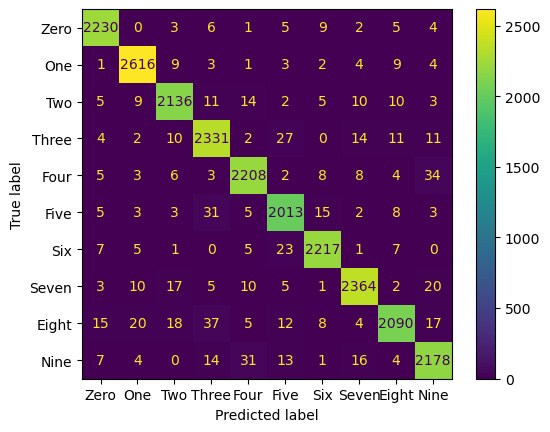

Confusion Matrix of dataset 9 for model 3 is: 


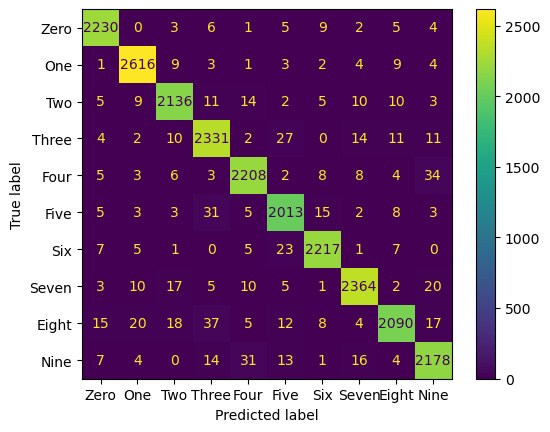

Confusion Matrix of dataset 9 for model 4 is: 


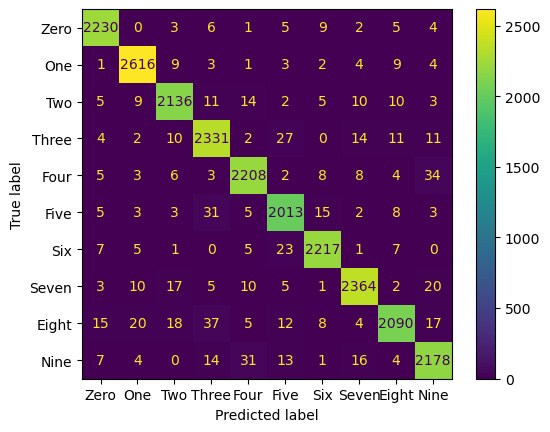

Confusion Matrix of dataset 9 for model 5 is: 


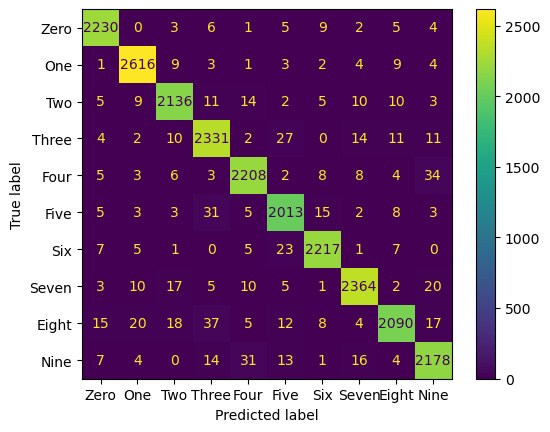

Confusion Matrix of dataset 9 for model 6 is: 


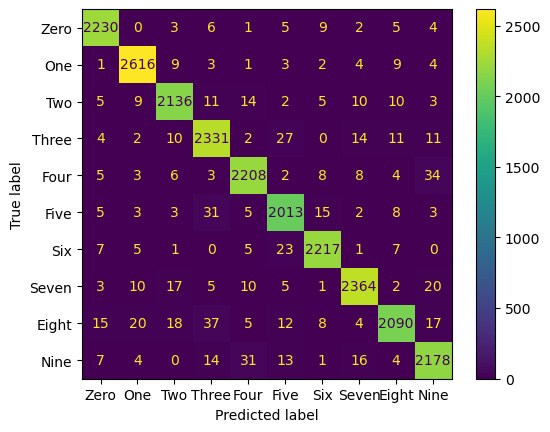

Confusion Matrix of dataset 9 for model 7 is: 


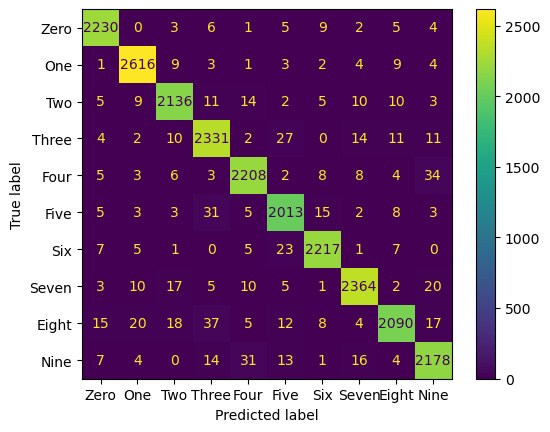

Confusion Matrix of dataset 9 for model 8 is: 


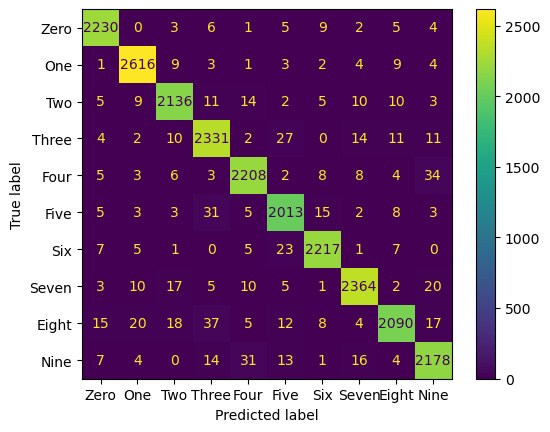

Confusion Matrix of dataset 9 for model 9 is: 


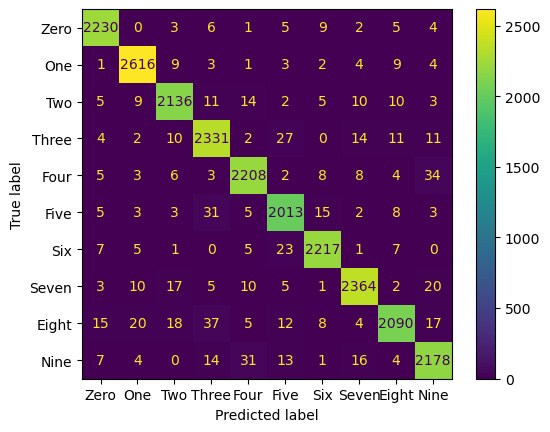

Confusion Matrix of dataset 9 for model 10 is: 


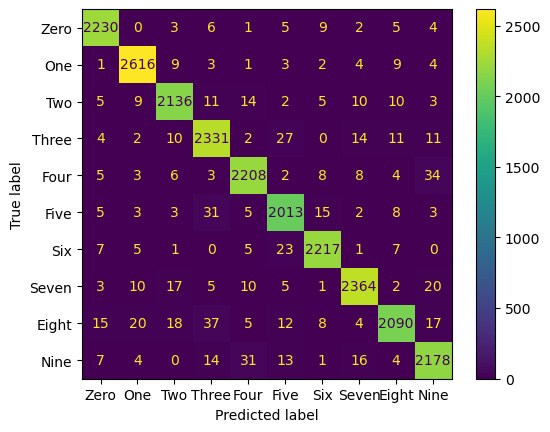

Confusion Matrix of dataset 9 for model 11 is: 


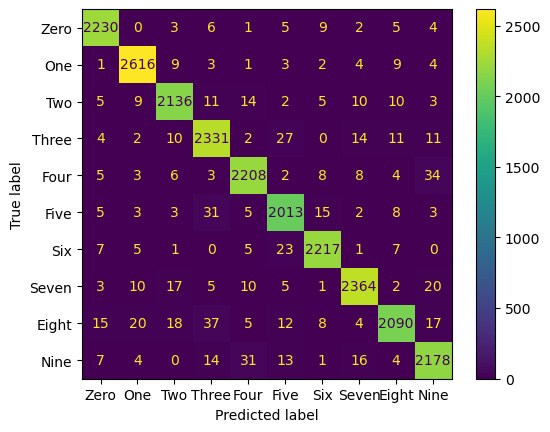

Confusion Matrix of dataset 9 for model 12 is: 


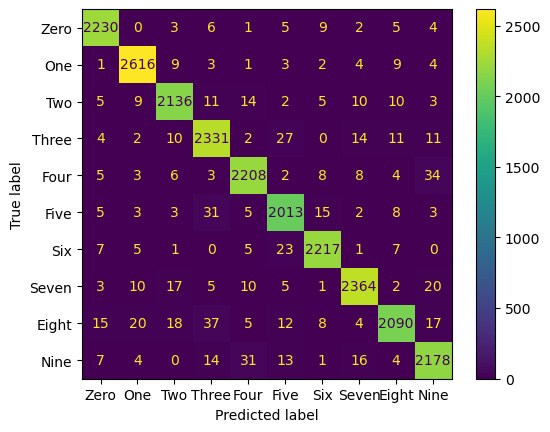

Confusion Matrix of dataset 9 for model 13 is: 


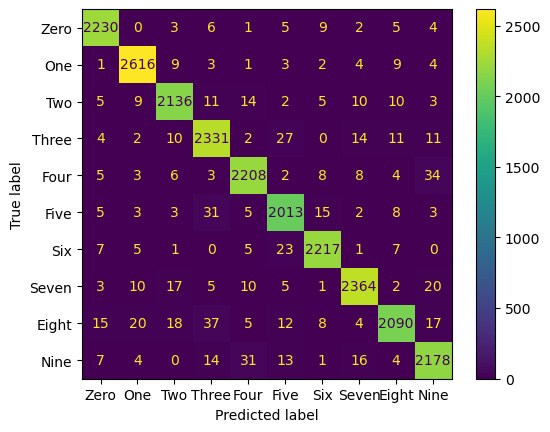

Confusion Matrix of dataset 9 for model 14 is: 


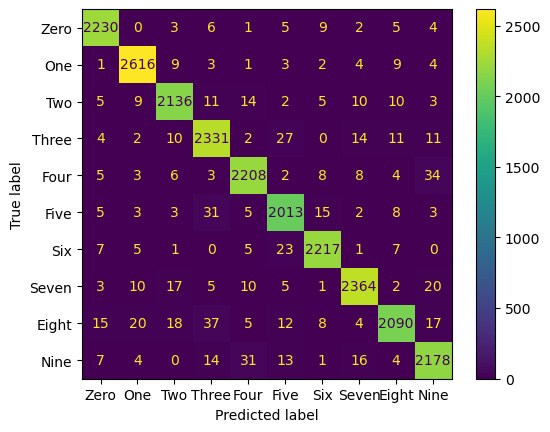

In [141]:
for i in range(10):
    for j in range(15):
        cm_display[i][j].plot()
        print('Confusion Matrix of dataset {} for model {} is: '.format(i,j))
        plt.savefig(f'images/split{i+1}model{j}_conf_{i*15+j}.png', dpi=300)
        # Display the plot
        plt.show()